In [1]:
import pandas_datareader as pdr
import datetime
import bs4 as bs
import os
import pandas_datareader.data as web
import pickle
import requests

In [4]:
# get sp500 tickers
def save_sp500_tickers():
    resp = requests.get('http://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
    soup = bs.BeautifulSoup(resp.text, 'lxml')
    table = soup.find('table', {'class': 'wikitable sortable'})
    tickers = []
    for row in table.findAll('tr')[1:]:
        ticker = row.findAll('td')[0].text
        tickers.append(ticker.rstrip())
    with open("sp500tickers.pickle", "wb") as f:
        pickle.dump(tickers, f)
    return tickers

In [5]:
tickers = sorted(save_sp500_tickers())
tickers[0]

'A'

In [ ]:
# get first stock ('A') from yahoo

start_date = datetime.date(2018,1,1)
end_date = datetime.date.today()
current_ticker = pdr.get_data_yahoo(symbols='A', start = start_date, end = end_date)
current_ticker['Ticker'] = len(current_ticker) * ['A']
current_ticker.reset_index('Date',inplace = True)
sp500 = current_ticker
sp500.head()

In [5]:
# get all S&P 500 stocks from yahoo

# successful stocks
i = 1  # already add stock 'A'

for ticker in tickers[1:]:
    try:
        current_ticker = pdr.get_data_yahoo(symbols=ticker, start = start_date, end = end_date)
    except:
        print("Error : skipping",ticker)
        continue
    current_ticker['Ticker'] = len(current_ticker) * [ticker]
    current_ticker.reset_index('Date',inplace = True)
    sp500 = sp500.append(current_ticker)
    print(ticker,"finished")
    i += 1

AAL finished
AAP finished
AAPL finished
ABBV finished
ABC finished
ABMD finished
ABT finished
ACN finished
ADBE finished
ADI finished
ADM finished
ADP finished
ADS finished
ADSK finished
AEE finished
AEP finished
AES finished
AFL finished
AGN finished
AIG finished
AIV finished
AIZ finished
AJG finished
AKAM finished
ALB finished
ALGN finished
ALK finished
ALL finished
ALLE finished
ALXN finished
AMAT finished
AMD finished
AME finished
AMG finished
AMGN finished
AMP finished
AMT finished
AMZN finished
ANET finished
ANSS finished
ANTM finished
AON finished
AOS finished
APA finished
APC finished
APD finished
APH finished
APTV finished
ARE finished
ARNC finished
ATVI finished
AVB finished
AVGO finished
AVY finished
AWK finished
AXP finished
AZO finished
BA finished
BAC finished
BAX finished
BBT finished
BBY finished
BDX finished
BEN finished
BF-B finished
BHF finished
BHGE finished
BIIB finished
BK finished
BKNG finished
BLK finished
BLL finished
BMY finished
BR finished
BRK-B finished
BSX

In [6]:
i

505

In [7]:
sp500

,Date,High,Low,Open,Close,Volume,Adj Close,Ticker
0,2018-01-02,67.889999,67.339996,67.419998,67.599998,1047800.0,66.979156,A
1,2018-01-03,69.489998,67.599998,67.620003,69.320000,1698900.0,68.683357,A
2,2018-01-04,69.820000,68.779999,69.540001,68.800003,2230700.0,68.168137,A
3,2018-01-05,70.099998,68.730003,68.730003,69.900002,1632500.0,69.258041,A
4,2018-01-08,70.330002,69.550003,69.730003,70.050003,1613400.0,69.406662,A
5,2018-01-09,72.330002,70.169998,70.680000,71.769997,2666100.0,71.110863,A
6,2018-01-10,71.449997,70.110001,71.449997,70.790001,2957200.0,70.139862,A
7,2018-01-11,71.180000,70.300003,70.919998,70.800003,1511100.0,70.149773,A
8,2018-01-12,71.860001,70.500000,70.730003,71.730003,1448100.0,71.071228,A
9,2018-01-16,72.470001,71.059998,72.019997,71.230003,1702700.0,70.575821,A


In [8]:
# export to csv as original

sp500_original = sp500.reset_index(drop = True) # reset index
sp500_original.rename(columns={'Date':'Timestamp'}, inplace=True) # change column name

# reorder the columns
cols = sp500_original.columns.tolist() 
cols = cols[:1] + cols[-1:] + cols[1:-1]
sp500_original = sp500_original[cols]
sp500_original.head()

,Timestamp,Ticker,High,Low,Open,Close,Volume,Adj Close
0,2018-01-02,A,67.889999,67.339996,67.419998,67.599998,1047800.0,66.979156
1,2018-01-03,A,69.489998,67.599998,67.620003,69.320000,1698900.0,68.683357
2,2018-01-04,A,69.820000,68.779999,69.540001,68.800003,2230700.0,68.168137
3,2018-01-05,A,70.099998,68.730003,68.730003,69.900002,1632500.0,69.258041
4,2018-01-08,A,70.330002,69.550003,69.730003,70.050003,1613400.0,69.406662


In [9]:
sp500_original.to_csv(r'/Users/panzichen/Global_AI/Zichen Pan - S&P500(Original).csv', index = None, header=True)

In [10]:
# export to csv as requested

sp500_df = sp500_original
sp500_df.rename(columns={'Close':'Daily Closing Price', 'Volume':'Daily Volume'}, inplace = True)
sp500_df.drop(['High', 'Low', 'Open', 'Adj Close'], axis = 1,inplace = True)
sp500_df.head()

,Timestamp,Ticker,Daily Closing Price,Daily Volume
0,2018-01-02,A,67.599998,1047800.0
1,2018-01-03,A,69.320000,1698900.0
2,2018-01-04,A,68.800003,2230700.0
3,2018-01-05,A,69.900002,1632500.0
4,2018-01-08,A,70.050003,1613400.0


In [11]:
sp500_df.to_csv(r'/Users/panzichen/Global_AI/Zichen Pan - S&P500(Requested).csv', index = None, header=True)

## Data Cleaning

In [12]:
sp500_df.isnull().sum()

Timestamp              0
Ticker                 0
Daily Closing Price    0
Daily Volume           0
dtype: int64

## Create SQL Table

In [13]:
import sqlite3

In [14]:
# connecting to the database  
connection = sqlite3.connect("sp500.db")

In [15]:
# cursor  
crsr = connection.cursor()

In [16]:
# drop table if necessary (to rerun the create command, or error: table already exists)
crsr.execute("""DROP TABLE sp500_df""")

In [17]:
crsr.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = crsr.fetchall()
print(tables)

[]


In [18]:
# SQL command to create a table in the database 
sql_command_create = """CREATE TABLE sp500_df (
NUM INTEGER PRIMARY KEY,
Ticker VARCHAR(20),
Timestamp DATE,  
Close FLOAT(8,6),  
Volume INTEGER);"""

In [19]:
crsr.execute(sql_command_create)

In [20]:
crsr.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = crsr.fetchall()
print(tables)

[('sp500_df',)]


In [21]:
# Insert data
for index, row in sp500_df.iterrows():
    format_str = """INSERT INTO sp500_df (NUM, Ticker, Timestamp, Close, Volume)
    VALUES ("{num}", "{ticker}", "{timestamp}", "{close}", "{volume}");"""

    sql_command = format_str.format(num = index, ticker = row['Ticker'], timestamp = row['Timestamp'],
                                    close = row['Daily Closing Price'], volume = int(row['Daily Volume']))
    crsr.execute(sql_command)

In [22]:
# print data
import pprint
sql_select = """SELECT * from sp500_df;"""
crsr.execute(sql_select)
pprint.pprint(crsr.fetchall())

[(0, 'A', '2018-01-02 00:00:00', 67.5999984741211, 1047800),
 (1, 'A', '2018-01-03 00:00:00', 69.31999969482422, 1698900),
 (2, 'A', '2018-01-04 00:00:00', 68.80000305175781, 2230700),
 (3, 'A', '2018-01-05 00:00:00', 69.9000015258789, 1632500),
 (4, 'A', '2018-01-08 00:00:00', 70.05000305175781, 1613400),
 (5, 'A', '2018-01-09 00:00:00', 71.7699966430664, 2666100),
 (6, 'A', '2018-01-10 00:00:00', 70.79000091552734, 2957200),
 (7, 'A', '2018-01-11 00:00:00', 70.80000305175781, 1511100),
 (8, 'A', '2018-01-12 00:00:00', 71.7300033569336, 1448100),
 (9, 'A', '2018-01-16 00:00:00', 71.2300033569336, 1702700),
 (10, 'A', '2018-01-17 00:00:00', 72.05999755859375, 1781800),
 (11, 'A', '2018-01-18 00:00:00', 72.19000244140625, 1828300),
 (12, 'A', '2018-01-19 00:00:00', 73.06999969482422, 2266100),
 (13, 'A', '2018-01-22 00:00:00', 73.4800033569336, 1963700),
 (14, 'A', '2018-01-23 00:00:00', 73.44000244140625, 1213400),
 (15, 'A', '2018-01-24 00:00:00', 73.58000183105469, 1754300),
 (16, 'A

 (2140, 'ABT', '2019-01-10 00:00:00', 69.08000183105469, 8051200),
 (2141, 'ABT', '2019-01-11 00:00:00', 69.33000183105469, 6583000),
 (2142, 'ABT', '2019-01-14 00:00:00', 68.2699966430664, 5122900),
 (2143, 'ABT', '2019-01-15 00:00:00', 70.47000122070312, 6306900),
 (2144, 'ABT', '2019-01-16 00:00:00', 69.81999969482422, 6357300),
 (2145, 'ABT', '2019-01-17 00:00:00', 70.5199966430664, 5427800),
 (2146, 'ABT', '2019-01-18 00:00:00', 71.41999816894531, 9404500),
 (2147, 'ABT', '2019-01-22 00:00:00', 71.48999786376953, 6541600),
 (2148, 'ABT', '2019-01-23 00:00:00', 69.91000366210938, 10196300),
 (2149, 'ABT', '2019-01-24 00:00:00', 70.86000061035156, 6437600),
 (2150, 'ABT', '2019-01-25 00:00:00', 71.1500015258789, 4824100),
 (2151, 'ABT', '2019-01-28 00:00:00', 69.05000305175781, 5942000),
 (2152, 'ACN', '2018-01-02 00:00:00', 153.83999633789062, 3061900),
 (2153, 'ACN', '2018-01-03 00:00:00', 154.5500030517578, 2064200),
 (2154, 'ACN', '2018-01-04 00:00:00', 156.3800048828125, 177700

 (4083, 'AEE', '2018-03-13 00:00:00', 54.09000015258789, 1603000),
 (4084, 'AEE', '2018-03-14 00:00:00', 54.630001068115234, 2063000),
 (4085, 'AEE', '2018-03-15 00:00:00', 54.77000045776367, 1513900),
 (4086, 'AEE', '2018-03-16 00:00:00', 55.4900016784668, 2834400),
 (4087, 'AEE', '2018-03-19 00:00:00', 55.20000076293945, 1135100),
 (4088, 'AEE', '2018-03-20 00:00:00', 55.130001068115234, 975800),
 (4089, 'AEE', '2018-03-21 00:00:00', 54.900001525878906, 1126700),
 (4090, 'AEE', '2018-03-22 00:00:00', 54.91999816894531, 1237700),
 (4091, 'AEE', '2018-03-23 00:00:00', 54.0099983215332, 1240700),
 (4092, 'AEE', '2018-03-26 00:00:00', 54.849998474121094, 1328900),
 (4093, 'AEE', '2018-03-27 00:00:00', 55.880001068115234, 1787500),
 (4094, 'AEE', '2018-03-28 00:00:00', 55.939998626708984, 1322800),
 (4095, 'AEE', '2018-03-29 00:00:00', 56.630001068115234, 2023800),
 (4096, 'AEE', '2018-04-02 00:00:00', 56.689998626708984, 2217700),
 (4097, 'AEE', '2018-04-03 00:00:00', 57.13999938964844, 

 (6210, 'AJG', '2018-02-05 00:00:00', 66.2699966430664, 1778200),
 (6211, 'AJG', '2018-02-06 00:00:00', 65.4000015258789, 2423900),
 (6212, 'AJG', '2018-02-07 00:00:00', 66.11000061035156, 1247800),
 (6213, 'AJG', '2018-02-08 00:00:00', 64.4000015258789, 2399500),
 (6214, 'AJG', '2018-02-09 00:00:00', 64.94000244140625, 1914500),
 (6215, 'AJG', '2018-02-12 00:00:00', 66.20999908447266, 1267000),
 (6216, 'AJG', '2018-02-13 00:00:00', 66.9800033569336, 988700),
 (6217, 'AJG', '2018-02-14 00:00:00', 68.19999694824219, 776700),
 (6218, 'AJG', '2018-02-15 00:00:00', 69.05000305175781, 912400),
 (6219, 'AJG', '2018-02-16 00:00:00', 68.97000122070312, 1111300),
 (6220, 'AJG', '2018-02-20 00:00:00', 69.30999755859375, 1051300),
 (6221, 'AJG', '2018-02-21 00:00:00', 68.91000366210938, 1174000),
 (6222, 'AJG', '2018-02-22 00:00:00', 68.12999725341797, 1384100),
 (6223, 'AJG', '2018-02-23 00:00:00', 68.98999786376953, 880000),
 (6224, 'AJG', '2018-02-26 00:00:00', 69.76000213623047, 928000),
 (62

 (8353, 'AMAT', '2018-01-23 00:00:00', 57.790000915527344, 8813500),
 (8354, 'AMAT', '2018-01-24 00:00:00', 56.880001068115234, 11787300),
 (8355, 'AMAT', '2018-01-25 00:00:00', 55.7599983215332, 15271900),
 (8356, 'AMAT', '2018-01-26 00:00:00', 57.119998931884766, 11253500),
 (8357, 'AMAT', '2018-01-29 00:00:00', 55.33000183105469, 12350600),
 (8358, 'AMAT', '2018-01-30 00:00:00', 53.380001068115234, 14603700),
 (8359, 'AMAT', '2018-01-31 00:00:00', 53.630001068115234, 13166800),
 (8360, 'AMAT', '2018-02-01 00:00:00', 53.279998779296875, 9706000),
 (8361, 'AMAT', '2018-02-02 00:00:00', 50.68000030517578, 16813100),
 (8362, 'AMAT', '2018-02-05 00:00:00', 48.310001373291016, 17999700),
 (8363, 'AMAT', '2018-02-06 00:00:00', 50.25, 21455700),
 (8364, 'AMAT', '2018-02-07 00:00:00', 48.689998626708984, 14763400),
 (8365, 'AMAT', '2018-02-08 00:00:00', 45.75, 19922900),
 (8366, 'AMAT', '2018-02-09 00:00:00', 48.08000183105469, 22648200),
 (8367, 'AMAT', '2018-02-12 00:00:00', 49.5, 16326100

 (10581, 'ANET', '2018-05-11 00:00:00', 259.9100036621094, 586700),
 (10582, 'ANET', '2018-05-14 00:00:00', 253.52000427246094, 1057000),
 (10583, 'ANET', '2018-05-15 00:00:00', 249.5500030517578, 735200),
 (10584, 'ANET', '2018-05-16 00:00:00', 249.1300048828125, 629100),
 (10585, 'ANET', '2018-05-17 00:00:00', 247.47000122070312, 1338200),
 (10586, 'ANET', '2018-05-18 00:00:00', 248.08999633789062, 481300),
 (10587, 'ANET', '2018-05-21 00:00:00', 254.25, 934500),
 (10588, 'ANET', '2018-05-22 00:00:00', 249.6199951171875, 804200),
 (10589, 'ANET', '2018-05-23 00:00:00', 255.97999572753906, 674900),
 (10590, 'ANET', '2018-05-24 00:00:00', 252.61000061035156, 512600),
 (10591, 'ANET', '2018-05-25 00:00:00', 255.75, 531200),
 (10592, 'ANET', '2018-05-29 00:00:00', 255.86000061035156, 1068800),
 (10593, 'ANET', '2018-05-30 00:00:00', 251.64999389648438, 892000),
 (10594, 'ANET', '2018-05-31 00:00:00', 251.55999755859375, 885000),
 (10595, 'ANET', '2018-06-01 00:00:00', 261.2200012207031, 

 (12928, 'APTV', '2018-01-25 00:00:00', 92.48999786376953, 1851500),
 (12929, 'APTV', '2018-01-26 00:00:00', 94.4800033569336, 2662900),
 (12930, 'APTV', '2018-01-29 00:00:00', 94.88999938964844, 3313100),
 (12931, 'APTV', '2018-01-30 00:00:00', 94.62999725341797, 1490200),
 (12932, 'APTV', '2018-01-31 00:00:00', 94.87999725341797, 3162900),
 (12933, 'APTV', '2018-02-01 00:00:00', 96.0199966430664, 2753400),
 (12934, 'APTV', '2018-02-02 00:00:00', 94.20999908447266, 2546900),
 (12935, 'APTV', '2018-02-05 00:00:00', 91.13999938964844, 2658400),
 (12936, 'APTV', '2018-02-06 00:00:00', 92.5999984741211, 3273300),
 (12937, 'APTV', '2018-02-07 00:00:00', 93.69000244140625, 1868200),
 (12938, 'APTV', '2018-02-08 00:00:00', 89.2699966430664, 2706700),
 (12939, 'APTV', '2018-02-09 00:00:00', 88.55999755859375, 3252000),
 (12940, 'APTV', '2018-02-12 00:00:00', 91.44000244140625, 1973200),
 (12941, 'APTV', '2018-02-13 00:00:00', 90.7699966430664, 1035800),
 (12942, 'APTV', '2018-02-14 00:00:00',

 (15080, 'AXP', '2018-01-25 00:00:00', 99.69000244140625, 3375200),
 (15081, 'AXP', '2018-01-26 00:00:00', 99.62999725341797, 3668700),
 (15082, 'AXP', '2018-01-29 00:00:00', 99.41000366210938, 3472100),
 (15083, 'AXP', '2018-01-30 00:00:00', 98.70999908447266, 3466500),
 (15084, 'AXP', '2018-01-31 00:00:00', 99.4000015258789, 3202900),
 (15085, 'AXP', '2018-02-01 00:00:00', 100.0, 2952100),
 (15086, 'AXP', '2018-02-02 00:00:00', 96.68000030517578, 4663300),
 (15087, 'AXP', '2018-02-05 00:00:00', 92.01000213623047, 6421900),
 (15088, 'AXP', '2018-02-06 00:00:00', 94.18000030517578, 7244000),
 (15089, 'AXP', '2018-02-07 00:00:00', 93.61000061035156, 3796800),
 (15090, 'AXP', '2018-02-08 00:00:00', 88.33999633789062, 5814900),
 (15091, 'AXP', '2018-02-09 00:00:00', 91.72000122070312, 8017600),
 (15092, 'AXP', '2018-02-12 00:00:00', 94.69999694824219, 7419200),
 (15093, 'AXP', '2018-02-13 00:00:00', 94.55999755859375, 3366700),
 (15094, 'AXP', '2018-02-14 00:00:00', 96.2300033569336, 3446

 (17580, 'BF-B', '2018-05-18 00:00:00', 59.220001220703125, 749000),
 (17581, 'BF-B', '2018-05-21 00:00:00', 58.779998779296875, 820200),
 (17582, 'BF-B', '2018-05-22 00:00:00', 58.45000076293945, 692300),
 (17583, 'BF-B', '2018-05-23 00:00:00', 58.400001525878906, 934000),
 (17584, 'BF-B', '2018-05-24 00:00:00', 58.54999923706055, 952500),
 (17585, 'BF-B', '2018-05-25 00:00:00', 56.790000915527344, 1381100),
 (17586, 'BF-B', '2018-05-29 00:00:00', 56.709999084472656, 1443800),
 (17587, 'BF-B', '2018-05-30 00:00:00', 57.7599983215332, 1459000),
 (17588, 'BF-B', '2018-05-31 00:00:00', 56.560001373291016, 2064700),
 (17589, 'BF-B', '2018-06-01 00:00:00', 55.59000015258789, 1733600),
 (17590, 'BF-B', '2018-06-04 00:00:00', 56.0099983215332, 1294600),
 (17591, 'BF-B', '2018-06-05 00:00:00', 55.869998931884766, 1950000),
 (17592, 'BF-B', '2018-06-06 00:00:00', 52.470001220703125, 3246500),
 (17593, 'BF-B', '2018-06-07 00:00:00', 51.2400016784668, 2191400),
 (17594, 'BF-B', '2018-06-08 00:00

 (20079, 'BR', '2018-09-10 00:00:00', 136.8300018310547, 582200),
 (20080, 'BR', '2018-09-11 00:00:00', 136.7100067138672, 626800),
 (20081, 'BR', '2018-09-12 00:00:00', 136.82000732421875, 519900),
 (20082, 'BR', '2018-09-13 00:00:00', 136.86000061035156, 754000),
 (20083, 'BR', '2018-09-14 00:00:00', 137.72000122070312, 551500),
 (20084, 'BR', '2018-09-17 00:00:00', 134.7899932861328, 554200),
 (20085, 'BR', '2018-09-18 00:00:00', 135.35000610351562, 578000),
 (20086, 'BR', '2018-09-19 00:00:00', 132.66000366210938, 751800),
 (20087, 'BR', '2018-09-20 00:00:00', 132.99000549316406, 942500),
 (20088, 'BR', '2018-09-21 00:00:00', 132.64999389648438, 1371800),
 (20089, 'BR', '2018-09-24 00:00:00', 133.4600067138672, 610400),
 (20090, 'BR', '2018-09-25 00:00:00', 134.14999389648438, 600300),
 (20091, 'BR', '2018-09-26 00:00:00', 132.2899932861328, 821500),
 (20092, 'BR', '2018-09-27 00:00:00', 131.24000549316406, 877700),
 (20093, 'BR', '2018-09-28 00:00:00', 131.9499969482422, 1102000),

 (22579, 'CB', '2019-01-03 00:00:00', 124.66999816894531, 1746200),
 (22580, 'CB', '2019-01-04 00:00:00', 128.39999389648438, 1977800),
 (22581, 'CB', '2019-01-07 00:00:00', 127.36000061035156, 1398900),
 (22582, 'CB', '2019-01-08 00:00:00', 126.37999725341797, 1627500),
 (22583, 'CB', '2019-01-09 00:00:00', 127.95999908447266, 2402000),
 (22584, 'CB', '2019-01-10 00:00:00', 129.52999877929688, 1307300),
 (22585, 'CB', '2019-01-11 00:00:00', 129.52000427246094, 1300400),
 (22586, 'CB', '2019-01-14 00:00:00', 130.83999633789062, 1877700),
 (22587, 'CB', '2019-01-15 00:00:00', 132.4499969482422, 2143900),
 (22588, 'CB', '2019-01-16 00:00:00', 132.9600067138672, 1803600),
 (22589, 'CB', '2019-01-17 00:00:00', 132.86000061035156, 2090800),
 (22590, 'CB', '2019-01-18 00:00:00', 133.58999633789062, 2240700),
 (22591, 'CB', '2019-01-22 00:00:00', 131.14999389648438, 2432100),
 (22592, 'CB', '2019-01-23 00:00:00', 132.05999755859375, 1212600),
 (22593, 'CB', '2019-01-24 00:00:00', 132.41000366

 (25078, 'CF', '2018-04-02 00:00:00', 36.619998931884766, 3022800),
 (25079, 'CF', '2018-04-03 00:00:00', 36.97999954223633, 2036600),
 (25080, 'CF', '2018-04-04 00:00:00', 37.11000061035156, 3302000),
 (25081, 'CF', '2018-04-05 00:00:00', 38.58000183105469, 4174100),
 (25082, 'CF', '2018-04-06 00:00:00', 36.83000183105469, 3400200),
 (25083, 'CF', '2018-04-09 00:00:00', 37.15999984741211, 1960400),
 (25084, 'CF', '2018-04-10 00:00:00', 37.27000045776367, 2852400),
 (25085, 'CF', '2018-04-11 00:00:00', 37.40999984741211, 1913700),
 (25086, 'CF', '2018-04-12 00:00:00', 38.20000076293945, 2122700),
 (25087, 'CF', '2018-04-13 00:00:00', 38.43000030517578, 1955700),
 (25088, 'CF', '2018-04-16 00:00:00', 38.45000076293945, 1634700),
 (25089, 'CF', '2018-04-17 00:00:00', 39.08000183105469, 1805900),
 (25090, 'CF', '2018-04-18 00:00:00', 40.02000045776367, 2064700),
 (25091, 'CF', '2018-04-19 00:00:00', 39.63999938964844, 1192400),
 (25092, 'CF', '2018-04-20 00:00:00', 38.720001220703125, 257

 (27578, 'CMA', '2018-07-24 00:00:00', 95.5, 2052200),
 (27579, 'CMA', '2018-07-25 00:00:00', 96.0999984741211, 2060800),
 (27580, 'CMA', '2018-07-26 00:00:00', 95.25, 1402000),
 (27581, 'CMA', '2018-07-27 00:00:00', 96.29000091552734, 1442100),
 (27582, 'CMA', '2018-07-30 00:00:00', 96.62000274658203, 1807500),
 (27583, 'CMA', '2018-07-31 00:00:00', 96.94000244140625, 2820200),
 (27584, 'CMA', '2018-08-01 00:00:00', 97.62000274658203, 1865200),
 (27585, 'CMA', '2018-08-02 00:00:00', 98.38999938964844, 1986600),
 (27586, 'CMA', '2018-08-03 00:00:00', 98.0199966430664, 1925200),
 (27587, 'CMA', '2018-08-06 00:00:00', 97.55999755859375, 1089200),
 (27588, 'CMA', '2018-08-07 00:00:00', 97.95999908447266, 1060200),
 (27589, 'CMA', '2018-08-08 00:00:00', 98.61000061035156, 1067800),
 (27590, 'CMA', '2018-08-09 00:00:00', 97.91000366210938, 898900),
 (27591, 'CMA', '2018-08-10 00:00:00', 97.13999938964844, 1203000),
 (27592, 'CMA', '2018-08-13 00:00:00', 96.26000213623047, 1098700),
 (27593,

 (30077, 'COG', '2018-11-12 00:00:00', 25.389999389648438, 8369300),
 (30078, 'COG', '2018-11-13 00:00:00', 26.489999771118164, 14013200),
 (30079, 'COG', '2018-11-14 00:00:00', 25.84000015258789, 12350400),
 (30080, 'COG', '2018-11-15 00:00:00', 25.639999389648438, 7547600),
 (30081, 'COG', '2018-11-16 00:00:00', 25.739999771118164, 6027700),
 (30082, 'COG', '2018-11-19 00:00:00', 25.799999237060547, 8700900),
 (30083, 'COG', '2018-11-20 00:00:00', 25.290000915527344, 6679200),
 (30084, 'COG', '2018-11-21 00:00:00', 25.780000686645508, 4752000),
 (30085, 'COG', '2018-11-23 00:00:00', 25.59000015258789, 2346600),
 (30086, 'COG', '2018-11-26 00:00:00', 24.969999313354492, 5950600),
 (30087, 'COG', '2018-11-27 00:00:00', 24.260000228881836, 9031400),
 (30088, 'COG', '2018-11-28 00:00:00', 24.899999618530273, 5177400),
 (30089, 'COG', '2018-11-29 00:00:00', 24.690000534057617, 6101500),
 (30090, 'COG', '2018-11-30 00:00:00', 25.15999984741211, 7097500),
 (30091, 'COG', '2018-12-03 00:00:0

 (32577, 'CSX', '2018-02-12 00:00:00', 53.15999984741211, 11144700),
 (32578, 'CSX', '2018-02-13 00:00:00', 53.560001373291016, 7490800),
 (32579, 'CSX', '2018-02-14 00:00:00', 55.150001525878906, 9448700),
 (32580, 'CSX', '2018-02-15 00:00:00', 55.560001373291016, 5622900),
 (32581, 'CSX', '2018-02-16 00:00:00', 56.099998474121094, 7596300),
 (32582, 'CSX', '2018-02-20 00:00:00', 54.59000015258789, 6388400),
 (32583, 'CSX', '2018-02-21 00:00:00', 54.959999084472656, 5810700),
 (32584, 'CSX', '2018-02-22 00:00:00', 54.9900016784668, 5161000),
 (32585, 'CSX', '2018-02-23 00:00:00', 55.84000015258789, 4568100),
 (32586, 'CSX', '2018-02-26 00:00:00', 56.209999084472656, 6677500),
 (32587, 'CSX', '2018-02-27 00:00:00', 55.119998931884766, 7013400),
 (32588, 'CSX', '2018-02-28 00:00:00', 53.720001220703125, 9933500),
 (32589, 'CSX', '2018-03-01 00:00:00', 54.52000045776367, 13347700),
 (32590, 'CSX', '2018-03-02 00:00:00', 55.040000915527344, 11229000),
 (32591, 'CSX', '2018-03-05 00:00:00'

 (35076, 'DAL', '2018-06-05 00:00:00', 54.66999816894531, 4968300),
 (35077, 'DAL', '2018-06-06 00:00:00', 54.16999816894531, 10825300),
 (35078, 'DAL', '2018-06-07 00:00:00', 53.459999084472656, 6858000),
 (35079, 'DAL', '2018-06-08 00:00:00', 54.09000015258789, 5858500),
 (35080, 'DAL', '2018-06-11 00:00:00', 54.88999938964844, 6800800),
 (35081, 'DAL', '2018-06-12 00:00:00', 54.54999923706055, 5253700),
 (35082, 'DAL', '2018-06-13 00:00:00', 54.650001525878906, 4384900),
 (35083, 'DAL', '2018-06-14 00:00:00', 54.900001525878906, 5456100),
 (35084, 'DAL', '2018-06-15 00:00:00', 55.18000030517578, 8125300),
 (35085, 'DAL', '2018-06-18 00:00:00', 54.79999923706055, 5836500),
 (35086, 'DAL', '2018-06-19 00:00:00', 53.779998779296875, 5830800),
 (35087, 'DAL', '2018-06-20 00:00:00', 53.84000015258789, 4541300),
 (35088, 'DAL', '2018-06-21 00:00:00', 53.72999954223633, 4806800),
 (35089, 'DAL', '2018-06-22 00:00:00', 52.720001220703125, 10311600),
 (35090, 'DAL', '2018-06-25 00:00:00', 51

 (37576, 'DISCK', '2018-10-09 00:00:00', 29.780000686645508, 1507000),
 (37577, 'DISCK', '2018-10-10 00:00:00', 29.34000015258789, 3782000),
 (37578, 'DISCK', '2018-10-11 00:00:00', 28.450000762939453, 3293800),
 (37579, 'DISCK', '2018-10-12 00:00:00', 29.049999237060547, 2308100),
 (37580, 'DISCK', '2018-10-15 00:00:00', 29.420000076293945, 2197700),
 (37581, 'DISCK', '2018-10-16 00:00:00', 30.079999923706055, 3626200),
 (37582, 'DISCK', '2018-10-17 00:00:00', 30.100000381469727, 4890900),
 (37583, 'DISCK', '2018-10-18 00:00:00', 30.09000015258789, 3185100),
 (37584, 'DISCK', '2018-10-19 00:00:00', 30.209999084472656, 2879500),
 (37585, 'DISCK', '2018-10-22 00:00:00', 30.110000610351562, 1934100),
 (37586, 'DISCK', '2018-10-23 00:00:00', 29.729999542236328, 2556600),
 (37587, 'DISCK', '2018-10-24 00:00:00', 27.079999923706055, 3728100),
 (37588, 'DISCK', '2018-10-25 00:00:00', 28.190000534057617, 2308700),
 (37589, 'DISCK', '2018-10-26 00:00:00', 27.420000076293945, 3881800),
 (37590,

 (40075, 'DVN', '2018-01-05 00:00:00', 43.11000061035156, 3722200),
 (40076, 'DVN', '2018-01-08 00:00:00', 43.25, 3596000),
 (40077, 'DVN', '2018-01-09 00:00:00', 42.540000915527344, 5826100),
 (40078, 'DVN', '2018-01-10 00:00:00', 42.18000030517578, 3457100),
 (40079, 'DVN', '2018-01-11 00:00:00', 43.06999969482422, 6856900),
 (40080, 'DVN', '2018-01-12 00:00:00', 44.040000915527344, 7671400),
 (40081, 'DVN', '2018-01-16 00:00:00', 43.2599983215332, 5634900),
 (40082, 'DVN', '2018-01-17 00:00:00', 43.439998626708984, 4305700),
 (40083, 'DVN', '2018-01-18 00:00:00', 43.20000076293945, 2714700),
 (40084, 'DVN', '2018-01-19 00:00:00', 42.849998474121094, 5604300),
 (40085, 'DVN', '2018-01-22 00:00:00', 44.810001373291016, 4840600),
 (40086, 'DVN', '2018-01-23 00:00:00', 44.52000045776367, 4173500),
 (40087, 'DVN', '2018-01-24 00:00:00', 44.52000045776367, 5302100),
 (40088, 'DVN', '2018-01-25 00:00:00', 43.90999984741211, 3633900),
 (40089, 'DVN', '2018-01-26 00:00:00', 43.86000061035156

 (42575, 'EL', '2018-05-01 00:00:00', 144.92999267578125, 3096200),
 (42576, 'EL', '2018-05-02 00:00:00', 132.58999633789062, 7249300),
 (42577, 'EL', '2018-05-03 00:00:00', 134.1199951171875, 4397200),
 (42578, 'EL', '2018-05-04 00:00:00', 135.74000549316406, 2293300),
 (42579, 'EL', '2018-05-07 00:00:00', 133.7899932861328, 2285700),
 (42580, 'EL', '2018-05-08 00:00:00', 136.1999969482422, 2376300),
 (42581, 'EL', '2018-05-09 00:00:00', 137.80999755859375, 2734600),
 (42582, 'EL', '2018-05-10 00:00:00', 138.5, 1691000),
 (42583, 'EL', '2018-05-11 00:00:00', 140.19000244140625, 2059200),
 (42584, 'EL', '2018-05-14 00:00:00', 140.6300048828125, 1621200),
 (42585, 'EL', '2018-05-15 00:00:00', 142.16000366210938, 2355400),
 (42586, 'EL', '2018-05-16 00:00:00', 144.6999969482422, 2500900),
 (42587, 'EL', '2018-05-17 00:00:00', 144.89999389648438, 2476700),
 (42588, 'EL', '2018-05-18 00:00:00', 145.49000549316406, 1795100),
 (42589, 'EL', '2018-05-21 00:00:00', 147.7899932861328, 1448700),

 (45074, 'ETN', '2018-08-21 00:00:00', 82.02999877929688, 2936600),
 (45075, 'ETN', '2018-08-22 00:00:00', 81.48999786376953, 2307600),
 (45076, 'ETN', '2018-08-23 00:00:00', 80.91999816894531, 1846600),
 (45077, 'ETN', '2018-08-24 00:00:00', 81.68000030517578, 1139000),
 (45078, 'ETN', '2018-08-27 00:00:00', 83.08999633789062, 2144700),
 (45079, 'ETN', '2018-08-28 00:00:00', 83.56999969482422, 2764000),
 (45080, 'ETN', '2018-08-29 00:00:00', 83.56999969482422, 2092700),
 (45081, 'ETN', '2018-08-30 00:00:00', 82.83000183105469, 1418500),
 (45082, 'ETN', '2018-08-31 00:00:00', 83.13999938964844, 1887900),
 (45083, 'ETN', '2018-09-04 00:00:00', 82.7699966430664, 2861400),
 (45084, 'ETN', '2018-09-05 00:00:00', 84.55999755859375, 2506600),
 (45085, 'ETN', '2018-09-06 00:00:00', 84.66999816894531, 1631200),
 (45086, 'ETN', '2018-09-07 00:00:00', 83.80999755859375, 3133400),
 (45087, 'ETN', '2018-09-10 00:00:00', 85.25, 2214100),
 (45088, 'ETN', '2018-09-11 00:00:00', 85.05999755859375, 225

 (47574, 'FAST', '2018-04-12 00:00:00', 50.709999084472656, 7564700),
 (47575, 'FAST', '2018-04-13 00:00:00', 50.08000183105469, 4291400),
 (47576, 'FAST', '2018-04-16 00:00:00', 50.66999816894531, 4112900),
 (47577, 'FAST', '2018-04-17 00:00:00', 50.529998779296875, 2696900),
 (47578, 'FAST', '2018-04-18 00:00:00', 50.68000030517578, 4300900),
 (47579, 'FAST', '2018-04-19 00:00:00', 50.58000183105469, 3781200),
 (47580, 'FAST', '2018-04-20 00:00:00', 50.4900016784668, 2754300),
 (47581, 'FAST', '2018-04-23 00:00:00', 50.369998931884766, 1958800),
 (47582, 'FAST', '2018-04-24 00:00:00', 49.11000061035156, 2676100),
 (47583, 'FAST', '2018-04-25 00:00:00', 49.56999969482422, 2209200),
 (47584, 'FAST', '2018-04-26 00:00:00', 49.86000061035156, 3831300),
 (47585, 'FAST', '2018-04-27 00:00:00', 51.02000045776367, 3278900),
 (47586, 'FAST', '2018-04-30 00:00:00', 49.9900016784668, 2497300),
 (47587, 'FAST', '2018-05-01 00:00:00', 49.36000061035156, 3044900),
 (47588, 'FAST', '2018-05-02 00:0

 (50073, 'FITB', '2018-08-02 00:00:00', 30.010000228881836, 6414700),
 (50074, 'FITB', '2018-08-03 00:00:00', 29.709999084472656, 5858100),
 (50075, 'FITB', '2018-08-06 00:00:00', 29.559999465942383, 4030800),
 (50076, 'FITB', '2018-08-07 00:00:00', 29.639999389648438, 3977700),
 (50077, 'FITB', '2018-08-08 00:00:00', 29.850000381469727, 2896300),
 (50078, 'FITB', '2018-08-09 00:00:00', 29.520000457763672, 4031500),
 (50079, 'FITB', '2018-08-10 00:00:00', 29.34000015258789, 4481200),
 (50080, 'FITB', '2018-08-13 00:00:00', 29.1299991607666, 3958600),
 (50081, 'FITB', '2018-08-14 00:00:00', 29.6200008392334, 3519500),
 (50082, 'FITB', '2018-08-15 00:00:00', 29.170000076293945, 4651900),
 (50083, 'FITB', '2018-08-16 00:00:00', 29.84000015258789, 3927600),
 (50084, 'FITB', '2018-08-17 00:00:00', 29.690000534057617, 4442600),
 (50085, 'FITB', '2018-08-20 00:00:00', 29.829999923706055, 2699300),
 (50086, 'FITB', '2018-08-21 00:00:00', 30.06999969482422, 3733600),
 (50087, 'FITB', '2018-08-2

 (52573, 'FRC', '2018-11-23 00:00:00', 94.04000091552734, 430200),
 (52574, 'FRC', '2018-11-26 00:00:00', 95.80999755859375, 2056200),
 (52575, 'FRC', '2018-11-27 00:00:00', 94.41000366210938, 1563200),
 (52576, 'FRC', '2018-11-28 00:00:00', 94.66999816894531, 1467100),
 (52577, 'FRC', '2018-11-29 00:00:00', 96.19000244140625, 1573600),
 (52578, 'FRC', '2018-11-30 00:00:00', 99.1500015258789, 1701100),
 (52579, 'FRC', '2018-12-03 00:00:00', 99.63999938964844, 969600),
 (52580, 'FRC', '2018-12-04 00:00:00', 96.87999725341797, 2043600),
 (52581, 'FRC', '2018-12-06 00:00:00', 96.77999877929688, 1850400),
 (52582, 'FRC', '2018-12-07 00:00:00', 94.47000122070312, 1613900),
 (52583, 'FRC', '2018-12-10 00:00:00', 92.56999969482422, 921000),
 (52584, 'FRC', '2018-12-11 00:00:00', 90.83000183105469, 1241700),
 (52585, 'FRC', '2018-12-12 00:00:00', 91.23999786376953, 948800),
 (52586, 'FRC', '2018-12-13 00:00:00', 89.66999816894531, 889700),
 (52587, 'FRC', '2018-12-14 00:00:00', 88.959999084472

 (55072, 'GM', '2018-02-22 00:00:00', 40.90999984741211, 8805900),
 (55073, 'GM', '2018-02-23 00:00:00', 40.90999984741211, 6424200),
 (55074, 'GM', '2018-02-26 00:00:00', 41.540000915527344, 9397100),
 (55075, 'GM', '2018-02-27 00:00:00', 40.16999816894531, 12738800),
 (55076, 'GM', '2018-02-28 00:00:00', 39.349998474121094, 23145200),
 (55077, 'GM', '2018-03-01 00:00:00', 37.790000915527344, 26183100),
 (55078, 'GM', '2018-03-02 00:00:00', 37.43000030517578, 24060500),
 (55079, 'GM', '2018-03-05 00:00:00', 37.7400016784668, 12011100),
 (55080, 'GM', '2018-03-06 00:00:00', 37.93000030517578, 12168500),
 (55081, 'GM', '2018-03-07 00:00:00', 37.7400016784668, 15052000),
 (55082, 'GM', '2018-03-08 00:00:00', 37.84000015258789, 13096700),
 (55083, 'GM', '2018-03-09 00:00:00', 37.84000015258789, 12272200),
 (55084, 'GM', '2018-03-12 00:00:00', 37.83000183105469, 11347200),
 (55085, 'GM', '2018-03-13 00:00:00', 38.0099983215332, 12406400),
 (55086, 'GM', '2018-03-14 00:00:00', 37.6899986267

 (57572, 'GWW', '2018-06-15 00:00:00', 319.6199951171875, 880100),
 (57573, 'GWW', '2018-06-18 00:00:00', 316.1099853515625, 518900),
 (57574, 'GWW', '2018-06-19 00:00:00', 312.1099853515625, 578700),
 (57575, 'GWW', '2018-06-20 00:00:00', 316.92999267578125, 432200),
 (57576, 'GWW', '2018-06-21 00:00:00', 313.17999267578125, 608900),
 (57577, 'GWW', '2018-06-22 00:00:00', 312.1000061035156, 651100),
 (57578, 'GWW', '2018-06-25 00:00:00', 305.6099853515625, 590800),
 (57579, 'GWW', '2018-06-26 00:00:00', 306.4800109863281, 401600),
 (57580, 'GWW', '2018-06-27 00:00:00', 305.3800048828125, 471100),
 (57581, 'GWW', '2018-06-28 00:00:00', 307.55999755859375, 451200),
 (57582, 'GWW', '2018-06-29 00:00:00', 308.3999938964844, 528400),
 (57583, 'GWW', '2018-07-02 00:00:00', 306.29998779296875, 948900),
 (57584, 'GWW', '2018-07-03 00:00:00', 297.760009765625, 672200),
 (57585, 'GWW', '2018-07-05 00:00:00', 297.8900146484375, 785200),
 (57586, 'GWW', '2018-07-06 00:00:00', 298.92999267578125, 

 (60071, 'HFC', '2018-10-05 00:00:00', 69.20999908447266, 1743900),
 (60072, 'HFC', '2018-10-08 00:00:00', 67.61000061035156, 1883900),
 (60073, 'HFC', '2018-10-09 00:00:00', 68.63999938964844, 1786000),
 (60074, 'HFC', '2018-10-10 00:00:00', 65.87999725341797, 2347800),
 (60075, 'HFC', '2018-10-11 00:00:00', 66.04000091552734, 2993200),
 (60076, 'HFC', '2018-10-12 00:00:00', 66.47000122070312, 2199300),
 (60077, 'HFC', '2018-10-15 00:00:00', 64.66000366210938, 1730800),
 (60078, 'HFC', '2018-10-16 00:00:00', 67.2699966430664, 2151000),
 (60079, 'HFC', '2018-10-17 00:00:00', 66.77999877929688, 2174100),
 (60080, 'HFC', '2018-10-18 00:00:00', 67.94999694824219, 1944500),
 (60081, 'HFC', '2018-10-19 00:00:00', 63.16999816894531, 3095600),
 (60082, 'HFC', '2018-10-22 00:00:00', 64.80000305175781, 2141400),
 (60083, 'HFC', '2018-10-23 00:00:00', 64.41000366210938, 2716700),
 (60084, 'HFC', '2018-10-24 00:00:00', 61.0099983215332, 2124300),
 (60085, 'HFC', '2018-10-25 00:00:00', 63.15000152

 (62571, 'HRB', '2018-01-04 00:00:00', 26.6200008392334, 2030100),
 (62572, 'HRB', '2018-01-05 00:00:00', 26.790000915527344, 1847900),
 (62573, 'HRB', '2018-01-08 00:00:00', 26.309999465942383, 3029700),
 (62574, 'HRB', '2018-01-09 00:00:00', 26.440000534057617, 1776200),
 (62575, 'HRB', '2018-01-10 00:00:00', 25.969999313354492, 1806600),
 (62576, 'HRB', '2018-01-11 00:00:00', 26.079999923706055, 2286200),
 (62577, 'HRB', '2018-01-12 00:00:00', 26.360000610351562, 1980300),
 (62578, 'HRB', '2018-01-16 00:00:00', 26.6299991607666, 4154800),
 (62579, 'HRB', '2018-01-17 00:00:00', 26.479999542236328, 1923200),
 (62580, 'HRB', '2018-01-18 00:00:00', 26.530000686645508, 2213300),
 (62581, 'HRB', '2018-01-19 00:00:00', 26.280000686645508, 2668300),
 (62582, 'HRB', '2018-01-22 00:00:00', 26.479999542236328, 3450900),
 (62583, 'HRB', '2018-01-23 00:00:00', 27.530000686645508, 5950600),
 (62584, 'HRB', '2018-01-24 00:00:00', 27.15999984741211, 4176400),
 (62585, 'HRB', '2018-01-25 00:00:00', 

 (65070, 'IDXX', '2018-04-27 00:00:00', 197.19000244140625, 289100),
 (65071, 'IDXX', '2018-04-30 00:00:00', 194.49000549316406, 425500),
 (65072, 'IDXX', '2018-05-01 00:00:00', 195.05999755859375, 447700),
 (65073, 'IDXX', '2018-05-02 00:00:00', 193.1699981689453, 617100),
 (65074, 'IDXX', '2018-05-03 00:00:00', 195.77999877929688, 553100),
 (65075, 'IDXX', '2018-05-04 00:00:00', 212.1999969482422, 939700),
 (65076, 'IDXX', '2018-05-07 00:00:00', 207.52999877929688, 804500),
 (65077, 'IDXX', '2018-05-08 00:00:00', 204.9600067138672, 544400),
 (65078, 'IDXX', '2018-05-09 00:00:00', 206.6199951171875, 293000),
 (65079, 'IDXX', '2018-05-10 00:00:00', 209.10000610351562, 427600),
 (65080, 'IDXX', '2018-05-11 00:00:00', 211.3800048828125, 328700),
 (65081, 'IDXX', '2018-05-14 00:00:00', 210.8800048828125, 230500),
 (65082, 'IDXX', '2018-05-15 00:00:00', 208.9199981689453, 361200),
 (65083, 'IDXX', '2018-05-16 00:00:00', 199.4199981689453, 1559100),
 (65084, 'IDXX', '2018-05-17 00:00:00', 1

 (67570, 'IPGP', '2018-08-20 00:00:00', 162.27000427246094, 788100),
 (67571, 'IPGP', '2018-08-21 00:00:00', 164.2100067138672, 685600),
 (67572, 'IPGP', '2018-08-22 00:00:00', 166.77000427246094, 839900),
 (67573, 'IPGP', '2018-08-23 00:00:00', 165.91000366210938, 574900),
 (67574, 'IPGP', '2018-08-24 00:00:00', 166.91000366210938, 361600),
 (67575, 'IPGP', '2018-08-27 00:00:00', 168.00999450683594, 348800),
 (67576, 'IPGP', '2018-08-28 00:00:00', 170.66000366210938, 548200),
 (67577, 'IPGP', '2018-08-29 00:00:00', 171.1999969482422, 879600),
 (67578, 'IPGP', '2018-08-30 00:00:00', 172.72999572753906, 888900),
 (67579, 'IPGP', '2018-08-31 00:00:00', 175.47999572753906, 837200),
 (67580, 'IPGP', '2018-09-04 00:00:00', 168.8000030517578, 974900),
 (67581, 'IPGP', '2018-09-05 00:00:00', 161.0800018310547, 906800),
 (67582, 'IPGP', '2018-09-06 00:00:00', 157.0, 1123800),
 (67583, 'IPGP', '2018-09-07 00:00:00', 157.47000122070312, 707800),
 (67584, 'IPGP', '2018-09-10 00:00:00', 157.720001

 (70069, 'JCI', '2018-12-11 00:00:00', 32.22999954223633, 7442300),
 (70070, 'JCI', '2018-12-12 00:00:00', 32.599998474121094, 4842100),
 (70071, 'JCI', '2018-12-13 00:00:00', 32.13999938964844, 4642300),
 (70072, 'JCI', '2018-12-14 00:00:00', 31.969999313354492, 4700600),
 (70073, 'JCI', '2018-12-17 00:00:00', 31.059999465942383, 6283900),
 (70074, 'JCI', '2018-12-18 00:00:00', 31.790000915527344, 6476000),
 (70075, 'JCI', '2018-12-19 00:00:00', 30.829999923706055, 6450900),
 (70076, 'JCI', '2018-12-20 00:00:00', 30.489999771118164, 8358800),
 (70077, 'JCI', '2018-12-21 00:00:00', 29.469999313354492, 13082300),
 (70078, 'JCI', '2018-12-24 00:00:00', 28.510000228881836, 5092900),
 (70079, 'JCI', '2018-12-26 00:00:00', 29.739999771118164, 6327900),
 (70080, 'JCI', '2018-12-27 00:00:00', 29.709999084472656, 7024900),
 (70081, 'JCI', '2018-12-28 00:00:00', 29.610000610351562, 6511600),
 (70082, 'JCI', '2018-12-31 00:00:00', 29.649999618530273, 6441300),
 (70083, 'JCI', '2019-01-02 00:00:0

 (72569, 'KEYS', '2018-03-23 00:00:00', 50.810001373291016, 654000),
 (72570, 'KEYS', '2018-03-26 00:00:00', 52.189998626708984, 704200),
 (72571, 'KEYS', '2018-03-27 00:00:00', 51.34000015258789, 843300),
 (72572, 'KEYS', '2018-03-28 00:00:00', 51.22999954223633, 795400),
 (72573, 'KEYS', '2018-03-29 00:00:00', 52.38999938964844, 602100),
 (72574, 'KEYS', '2018-04-02 00:00:00', 51.13999938964844, 771200),
 (72575, 'KEYS', '2018-04-03 00:00:00', 51.630001068115234, 966300),
 (72576, 'KEYS', '2018-04-04 00:00:00', 52.02000045776367, 767100),
 (72577, 'KEYS', '2018-04-05 00:00:00', 52.04999923706055, 726500),
 (72578, 'KEYS', '2018-04-06 00:00:00', 50.56999969482422, 758200),
 (72579, 'KEYS', '2018-04-09 00:00:00', 51.290000915527344, 681200),
 (72580, 'KEYS', '2018-04-10 00:00:00', 52.83000183105469, 909800),
 (72581, 'KEYS', '2018-04-11 00:00:00', 53.11000061035156, 673500),
 (72582, 'KEYS', '2018-04-12 00:00:00', 53.84000015258789, 795300),
 (72583, 'KEYS', '2018-04-13 00:00:00', 53.8

 (75068, 'KSS', '2018-07-16 00:00:00', 70.6500015258789, 3471100),
 (75069, 'KSS', '2018-07-17 00:00:00', 70.93000030517578, 2692800),
 (75070, 'KSS', '2018-07-18 00:00:00', 72.33000183105469, 2440100),
 (75071, 'KSS', '2018-07-19 00:00:00', 74.43000030517578, 4989800),
 (75072, 'KSS', '2018-07-20 00:00:00', 73.6500015258789, 2500400),
 (75073, 'KSS', '2018-07-23 00:00:00', 74.01000213623047, 1878400),
 (75074, 'KSS', '2018-07-24 00:00:00', 72.83999633789062, 1700900),
 (75075, 'KSS', '2018-07-25 00:00:00', 73.87000274658203, 1394800),
 (75076, 'KSS', '2018-07-26 00:00:00', 73.63999938964844, 1632300),
 (75077, 'KSS', '2018-07-27 00:00:00', 72.5199966430664, 1756200),
 (75078, 'KSS', '2018-07-30 00:00:00', 73.73999786376953, 1537500),
 (75079, 'KSS', '2018-07-31 00:00:00', 73.87000274658203, 1760000),
 (75080, 'KSS', '2018-08-01 00:00:00', 70.47000122070312, 2788400),
 (75081, 'KSS', '2018-08-02 00:00:00', 71.88999938964844, 2985500),
 (75082, 'KSS', '2018-08-03 00:00:00', 72.309997558

 (77568, 'LLY', '2018-03-06 00:00:00', 77.19000244140625, 2962700),
 (77569, 'LLY', '2018-03-07 00:00:00', 77.44000244140625, 2266500),
 (77570, 'LLY', '2018-03-08 00:00:00', 78.88999938964844, 3497200),
 (77571, 'LLY', '2018-03-09 00:00:00', 79.61000061035156, 4399500),
 (77572, 'LLY', '2018-03-12 00:00:00', 79.04000091552734, 5059600),
 (77573, 'LLY', '2018-03-13 00:00:00', 79.1500015258789, 4863200),
 (77574, 'LLY', '2018-03-14 00:00:00', 78.48999786376953, 3167900),
 (77575, 'LLY', '2018-03-15 00:00:00', 78.75, 3910100),
 (77576, 'LLY', '2018-03-16 00:00:00', 80.48999786376953, 8326300),
 (77577, 'LLY', '2018-03-19 00:00:00', 78.7300033569336, 5117000),
 (77578, 'LLY', '2018-03-20 00:00:00', 78.37000274658203, 3943800),
 (77579, 'LLY', '2018-03-21 00:00:00', 78.23999786376953, 4052000),
 (77580, 'LLY', '2018-03-22 00:00:00', 76.52999877929688, 3816900),
 (77581, 'LLY', '2018-03-23 00:00:00', 74.76000213623047, 4298100),
 (77582, 'LLY', '2018-03-26 00:00:00', 76.18000030517578, 3488

 (80067, 'M', '2018-06-26 00:00:00', 37.86000061035156, 6398100),
 (80068, 'M', '2018-06-27 00:00:00', 37.880001068115234, 6102200),
 (80069, 'M', '2018-06-28 00:00:00', 38.47999954223633, 4930500),
 (80070, 'M', '2018-06-29 00:00:00', 37.43000030517578, 4854400),
 (80071, 'M', '2018-07-02 00:00:00', 36.540000915527344, 7543000),
 (80072, 'M', '2018-07-03 00:00:00', 37.130001068115234, 2981800),
 (80073, 'M', '2018-07-05 00:00:00', 36.88999938964844, 4213400),
 (80074, 'M', '2018-07-06 00:00:00', 36.88999938964844, 4197500),
 (80075, 'M', '2018-07-09 00:00:00', 36.459999084472656, 5836500),
 (80076, 'M', '2018-07-10 00:00:00', 36.720001220703125, 6810800),
 (80077, 'M', '2018-07-11 00:00:00', 36.439998626708984, 4536700),
 (80078, 'M', '2018-07-12 00:00:00', 36.119998931884766, 8728100),
 (80079, 'M', '2018-07-13 00:00:00', 36.38999938964844, 6018400),
 (80080, 'M', '2018-07-16 00:00:00', 36.9900016784668, 7190300),
 (80081, 'M', '2018-07-17 00:00:00', 37.06999969482422, 5874000),
 (80

 (82567, 'MCK', '2018-10-17 00:00:00', 135.0399932861328, 1377600),
 (82568, 'MCK', '2018-10-18 00:00:00', 132.6999969482422, 1905300),
 (82569, 'MCK', '2018-10-19 00:00:00', 132.38999938964844, 1919400),
 (82570, 'MCK', '2018-10-22 00:00:00', 126.7300033569336, 1842200),
 (82571, 'MCK', '2018-10-23 00:00:00', 127.29000091552734, 1185300),
 (82572, 'MCK', '2018-10-24 00:00:00', 121.58000183105469, 2444700),
 (82573, 'MCK', '2018-10-25 00:00:00', 121.98999786376953, 3269400),
 (82574, 'MCK', '2018-10-26 00:00:00', 118.38999938964844, 2650500),
 (82575, 'MCK', '2018-10-29 00:00:00', 120.7699966430664, 1665500),
 (82576, 'MCK', '2018-10-30 00:00:00', 124.12000274658203, 1608400),
 (82577, 'MCK', '2018-10-31 00:00:00', 124.76000213623047, 1360100),
 (82578, 'MCK', '2018-11-01 00:00:00', 129.08999633789062, 1399400),
 (82579, 'MCK', '2018-11-02 00:00:00', 125.41000366210938, 1601400),
 (82580, 'MCK', '2018-11-05 00:00:00', 127.12000274658203, 1275500),
 (82581, 'MCK', '2018-11-06 00:00:00',

 (85066, 'MMM', '2018-01-16 00:00:00', 244.74000549316406, 2411100),
 (85067, 'MMM', '2018-01-17 00:00:00', 248.11000061035156, 2435700),
 (85068, 'MMM', '2018-01-18 00:00:00', 245.91000366210938, 2233500),
 (85069, 'MMM', '2018-01-19 00:00:00', 248.17999267578125, 2013500),
 (85070, 'MMM', '2018-01-22 00:00:00', 247.3000030517578, 1660500),
 (85071, 'MMM', '2018-01-23 00:00:00', 246.30999755859375, 1822700),
 (85072, 'MMM', '2018-01-24 00:00:00', 247.69000244140625, 3471000),
 (85073, 'MMM', '2018-01-25 00:00:00', 252.36000061035156, 3507900),
 (85074, 'MMM', '2018-01-26 00:00:00', 258.6300048828125, 3730600),
 (85075, 'MMM', '2018-01-29 00:00:00', 256.010009765625, 2306300),
 (85076, 'MMM', '2018-01-30 00:00:00', 251.5399932861328, 2412600),
 (85077, 'MMM', '2018-01-31 00:00:00', 250.5, 3136400),
 (85078, 'MMM', '2018-02-01 00:00:00', 247.94000244140625, 2665500),
 (85079, 'MMM', '2018-02-02 00:00:00', 245.1699981689453, 3925700),
 (85080, 'MMM', '2018-02-05 00:00:00', 231.4400024414

 (87566, 'MSFT', '2018-05-09 00:00:00', 96.94000244140625, 27327400),
 (87567, 'MSFT', '2018-05-10 00:00:00', 97.91000366210938, 22388100),
 (87568, 'MSFT', '2018-05-11 00:00:00', 97.69999694824219, 16778300),
 (87569, 'MSFT', '2018-05-14 00:00:00', 98.02999877929688, 19454100),
 (87570, 'MSFT', '2018-05-15 00:00:00', 97.31999969482422, 24594000),
 (87571, 'MSFT', '2018-05-16 00:00:00', 97.1500015258789, 17384700),
 (87572, 'MSFT', '2018-05-17 00:00:00', 96.18000030517578, 17246700),
 (87573, 'MSFT', '2018-05-18 00:00:00', 96.36000061035156, 17865800),
 (87574, 'MSFT', '2018-05-21 00:00:00', 97.5999984741211, 19422500),
 (87575, 'MSFT', '2018-05-22 00:00:00', 97.5, 15441200),
 (87576, 'MSFT', '2018-05-23 00:00:00', 98.66000366210938, 21114800),
 (87577, 'MSFT', '2018-05-24 00:00:00', 98.30999755859375, 26649300),
 (87578, 'MSFT', '2018-05-25 00:00:00', 98.36000061035156, 18363900),
 (87579, 'MSFT', '2018-05-29 00:00:00', 98.01000213623047, 28671000),
 (87580, 'MSFT', '2018-05-30 00:00:

 (90065, 'NDAQ', '2018-08-29 00:00:00', 94.8499984741211, 505000),
 (90066, 'NDAQ', '2018-08-30 00:00:00', 94.5, 460500),
 (90067, 'NDAQ', '2018-08-31 00:00:00', 95.44000244140625, 806900),
 (90068, 'NDAQ', '2018-09-04 00:00:00', 96.73999786376953, 1062800),
 (90069, 'NDAQ', '2018-09-05 00:00:00', 94.5, 941800),
 (90070, 'NDAQ', '2018-09-06 00:00:00', 93.08000183105469, 751700),
 (90071, 'NDAQ', '2018-09-07 00:00:00', 93.1500015258789, 559300),
 (90072, 'NDAQ', '2018-09-10 00:00:00', 93.4000015258789, 469700),
 (90073, 'NDAQ', '2018-09-11 00:00:00', 93.76000213623047, 480800),
 (90074, 'NDAQ', '2018-09-12 00:00:00', 91.5199966430664, 824800),
 (90075, 'NDAQ', '2018-09-13 00:00:00', 91.8499984741211, 655700),
 (90076, 'NDAQ', '2018-09-14 00:00:00', 90.7300033569336, 507400),
 (90077, 'NDAQ', '2018-09-17 00:00:00', 89.12000274658203, 1029100),
 (90078, 'NDAQ', '2018-09-18 00:00:00', 90.08999633789062, 834900),
 (90079, 'NDAQ', '2018-09-19 00:00:00', 89.97000122070312, 859500),
 (90080, '

 (92565, 'NOC', '2018-12-21 00:00:00', 235.24000549316406, 3054400),
 (92566, 'NOC', '2018-12-24 00:00:00', 226.22999572753906, 814500),
 (92567, 'NOC', '2018-12-26 00:00:00', 232.63999938964844, 1635700),
 (92568, 'NOC', '2018-12-27 00:00:00', 239.57000732421875, 1252900),
 (92569, 'NOC', '2018-12-28 00:00:00', 242.25, 1272100),
 (92570, 'NOC', '2018-12-31 00:00:00', 244.89999389648438, 1111700),
 (92571, 'NOC', '2019-01-02 00:00:00', 246.3699951171875, 1637900),
 (92572, 'NOC', '2019-01-03 00:00:00', 239.9199981689453, 1703900),
 (92573, 'NOC', '2019-01-04 00:00:00', 247.89999389648438, 1127800),
 (92574, 'NOC', '2019-01-07 00:00:00', 249.8300018310547, 1388500),
 (92575, 'NOC', '2019-01-08 00:00:00', 250.9600067138672, 1082400),
 (92576, 'NOC', '2019-01-09 00:00:00', 252.14999389648438, 727700),
 (92577, 'NOC', '2019-01-10 00:00:00', 257.6600036621094, 1063700),
 (92578, 'NOC', '2019-01-11 00:00:00', 256.04998779296875, 668200),
 (92579, 'NOC', '2019-01-14 00:00:00', 259.95999145507

 (95064, 'NWSA', '2018-03-21 00:00:00', 16.510000228881836, 1560300),
 (95065, 'NWSA', '2018-03-22 00:00:00', 16.270000457763672, 2142700),
 (95066, 'NWSA', '2018-03-23 00:00:00', 15.5600004196167, 2208000),
 (95067, 'NWSA', '2018-03-26 00:00:00', 15.680000305175781, 2485900),
 (95068, 'NWSA', '2018-03-27 00:00:00', 15.579999923706055, 1557600),
 (95069, 'NWSA', '2018-03-28 00:00:00', 15.430000305175781, 3200500),
 (95070, 'NWSA', '2018-03-29 00:00:00', 15.800000190734863, 1930600),
 (95071, 'NWSA', '2018-04-02 00:00:00', 15.40999984741211, 1884800),
 (95072, 'NWSA', '2018-04-03 00:00:00', 15.640000343322754, 1978900),
 (95073, 'NWSA', '2018-04-04 00:00:00', 15.779999732971191, 2055100),
 (95074, 'NWSA', '2018-04-05 00:00:00', 15.75, 2166900),
 (95075, 'NWSA', '2018-04-06 00:00:00', 15.5, 1306800),
 (95076, 'NWSA', '2018-04-09 00:00:00', 15.649999618530273, 2584000),
 (95077, 'NWSA', '2018-04-10 00:00:00', 15.949999809265137, 1651200),
 (95078, 'NWSA', '2018-04-11 00:00:00', 15.8000001

 (97564, 'PCAR', '2018-07-13 00:00:00', 63.45000076293945, 2214500),
 (97565, 'PCAR', '2018-07-16 00:00:00', 62.56999969482422, 1836700),
 (97566, 'PCAR', '2018-07-17 00:00:00', 63.209999084472656, 1527300),
 (97567, 'PCAR', '2018-07-18 00:00:00', 63.40999984741211, 2556100),
 (97568, 'PCAR', '2018-07-19 00:00:00', 63.45000076293945, 2056100),
 (97569, 'PCAR', '2018-07-20 00:00:00', 62.75, 1667100),
 (97570, 'PCAR', '2018-07-23 00:00:00', 62.91999816894531, 2668800),
 (97571, 'PCAR', '2018-07-24 00:00:00', 63.25, 4829800),
 (97572, 'PCAR', '2018-07-25 00:00:00', 64.16999816894531, 3615000),
 (97573, 'PCAR', '2018-07-26 00:00:00', 65.41999816894531, 2985800),
 (97574, 'PCAR', '2018-07-27 00:00:00', 66.06999969482422, 2283000),
 (97575, 'PCAR', '2018-07-30 00:00:00', 65.01000213623047, 2251200),
 (97576, 'PCAR', '2018-07-31 00:00:00', 65.72000122070312, 2556400),
 (97577, 'PCAR', '2018-08-01 00:00:00', 63.970001220703125, 1794000),
 (97578, 'PCAR', '2018-08-02 00:00:00', 63.2900009155273

 (100063, 'PKG', '2018-11-01 00:00:00', 95.86000061035156, 1115000),
 (100064, 'PKG', '2018-11-02 00:00:00', 94.9000015258789, 1189000),
 (100065, 'PKG', '2018-11-05 00:00:00', 96.44000244140625, 880800),
 (100066, 'PKG', '2018-11-06 00:00:00', 96.56999969482422, 1218100),
 (100067, 'PKG', '2018-11-07 00:00:00', 98.66999816894531, 1154100),
 (100068, 'PKG', '2018-11-08 00:00:00', 97.61000061035156, 963600),
 (100069, 'PKG', '2018-11-09 00:00:00', 96.0, 664800),
 (100070, 'PKG', '2018-11-12 00:00:00', 94.88999938964844, 635500),
 (100071, 'PKG', '2018-11-13 00:00:00', 95.44000244140625, 751900),
 (100072, 'PKG', '2018-11-14 00:00:00', 95.33999633789062, 639300),
 (100073, 'PKG', '2018-11-15 00:00:00', 96.11000061035156, 572500),
 (100074, 'PKG', '2018-11-16 00:00:00', 97.05000305175781, 545700),
 (100075, 'PKG', '2018-11-19 00:00:00', 96.83999633789062, 743200),
 (100076, 'PKG', '2018-11-20 00:00:00', 95.33999633789062, 808100),
 (100077, 'PKG', '2018-11-21 00:00:00', 95.7699966430664, 

 (102563, 'PRU', '2018-02-13 00:00:00', 106.88999938964844, 2818300),
 (102564, 'PRU', '2018-02-14 00:00:00', 111.2699966430664, 2934800),
 (102565, 'PRU', '2018-02-15 00:00:00', 109.7300033569336, 2354700),
 (102566, 'PRU', '2018-02-16 00:00:00', 109.43000030517578, 2520400),
 (102567, 'PRU', '2018-02-20 00:00:00', 108.4800033569336, 2231400),
 (102568, 'PRU', '2018-02-21 00:00:00', 108.62999725341797, 2468100),
 (102569, 'PRU', '2018-02-22 00:00:00', 107.79000091552734, 2186100),
 (102570, 'PRU', '2018-02-23 00:00:00', 108.9800033569336, 1823100),
 (102571, 'PRU', '2018-02-26 00:00:00', 110.12000274658203, 1919400),
 (102572, 'PRU', '2018-02-27 00:00:00', 108.69000244140625, 2483800),
 (102573, 'PRU', '2018-02-28 00:00:00', 106.31999969482422, 2053200),
 (102574, 'PRU', '2018-03-01 00:00:00', 103.93000030517578, 2785800),
 (102575, 'PRU', '2018-03-02 00:00:00', 105.5999984741211, 2412700),
 (102576, 'PRU', '2018-03-05 00:00:00', 106.22000122070312, 2269900),
 (102577, 'PRU', '2018-03

 (105062, 'RCL', '2018-06-06 00:00:00', 104.37999725341797, 2641300),
 (105063, 'RCL', '2018-06-07 00:00:00', 104.4000015258789, 1153800),
 (105064, 'RCL', '2018-06-08 00:00:00', 103.4800033569336, 1504800),
 (105065, 'RCL', '2018-06-11 00:00:00', 103.68000030517578, 1235000),
 (105066, 'RCL', '2018-06-12 00:00:00', 105.69999694824219, 3381600),
 (105067, 'RCL', '2018-06-13 00:00:00', 107.9800033569336, 2570300),
 (105068, 'RCL', '2018-06-14 00:00:00', 113.5, 5100800),
 (105069, 'RCL', '2018-06-15 00:00:00', 114.51000213623047, 3380700),
 (105070, 'RCL', '2018-06-18 00:00:00', 114.62000274658203, 2004700),
 (105071, 'RCL', '2018-06-19 00:00:00', 112.30000305175781, 2359800),
 (105072, 'RCL', '2018-06-20 00:00:00', 111.55000305175781, 2118100),
 (105073, 'RCL', '2018-06-21 00:00:00', 110.22000122070312, 2657200),
 (105074, 'RCL', '2018-06-22 00:00:00', 111.55000305175781, 2468600),
 (105075, 'RCL', '2018-06-25 00:00:00', 105.38999938964844, 3431700),
 (105076, 'RCL', '2018-06-26 00:00:0

 (107062, 'RJF', '2018-11-20 00:00:00', 74.66999816894531, 1008000),
 (107063, 'RJF', '2018-11-21 00:00:00', 76.0999984741211, 702000),
 (107064, 'RJF', '2018-11-23 00:00:00', 76.63999938964844, 519500),
 (107065, 'RJF', '2018-11-26 00:00:00', 79.16000366210938, 980600),
 (107066, 'RJF', '2018-11-27 00:00:00', 76.91999816894531, 1066700),
 (107067, 'RJF', '2018-11-28 00:00:00', 77.62999725341797, 1372700),
 (107068, 'RJF', '2018-11-29 00:00:00', 76.2699966430664, 1354500),
 (107069, 'RJF', '2018-11-30 00:00:00', 79.7300033569336, 1579600),
 (107070, 'RJF', '2018-12-03 00:00:00', 79.83000183105469, 1356400),
 (107071, 'RJF', '2018-12-04 00:00:00', 76.25, 2250900),
 (107072, 'RJF', '2018-12-06 00:00:00', 77.4800033569336, 1977700),
 (107073, 'RJF', '2018-12-07 00:00:00', 75.37999725341797, 1284700),
 (107074, 'RJF', '2018-12-10 00:00:00', 75.58000183105469, 1089400),
 (107075, 'RJF', '2018-12-11 00:00:00', 74.97000122070312, 2946800),
 (107076, 'RJF', '2018-12-12 00:00:00', 76.4700012207

 (109561, 'SBUX', '2018-02-20 00:00:00', 55.970001220703125, 9450900),
 (109562, 'SBUX', '2018-02-21 00:00:00', 56.099998474121094, 7851000),
 (109563, 'SBUX', '2018-02-22 00:00:00', 55.400001525878906, 10172400),
 (109564, 'SBUX', '2018-02-23 00:00:00', 56.13999938964844, 11394400),
 (109565, 'SBUX', '2018-02-26 00:00:00', 57.16999816894531, 8713800),
 (109566, 'SBUX', '2018-02-27 00:00:00', 56.56999969482422, 8821400),
 (109567, 'SBUX', '2018-02-28 00:00:00', 57.099998474121094, 11541100),
 (109568, 'SBUX', '2018-03-01 00:00:00', 56.16999816894531, 11127600),
 (109569, 'SBUX', '2018-03-02 00:00:00', 56.93000030517578, 11555100),
 (109570, 'SBUX', '2018-03-05 00:00:00', 56.9900016784668, 7835400),
 (109571, 'SBUX', '2018-03-06 00:00:00', 57.029998779296875, 8046800),
 (109572, 'SBUX', '2018-03-07 00:00:00', 57.029998779296875, 7044100),
 (109573, 'SBUX', '2018-03-08 00:00:00', 57.470001220703125, 7434700),
 (109574, 'SBUX', '2018-03-09 00:00:00', 58.459999084472656, 9539600),
 (109575

 (112061, 'SNPS', '2018-06-13 00:00:00', 90.47000122070312, 709000),
 (112062, 'SNPS', '2018-06-14 00:00:00', 90.87000274658203, 545400),
 (112063, 'SNPS', '2018-06-15 00:00:00', 90.56999969482422, 1362500),
 (112064, 'SNPS', '2018-06-18 00:00:00', 90.4800033569336, 923400),
 (112065, 'SNPS', '2018-06-19 00:00:00', 89.19999694824219, 1171000),
 (112066, 'SNPS', '2018-06-20 00:00:00', 90.30999755859375, 930100),
 (112067, 'SNPS', '2018-06-21 00:00:00', 89.2300033569336, 622300),
 (112068, 'SNPS', '2018-06-22 00:00:00', 88.12000274658203, 1020200),
 (112069, 'SNPS', '2018-06-25 00:00:00', 86.5199966430664, 1001900),
 (112070, 'SNPS', '2018-06-26 00:00:00', 86.41000366210938, 912600),
 (112071, 'SNPS', '2018-06-27 00:00:00', 84.56999969482422, 1126700),
 (112072, 'SNPS', '2018-06-28 00:00:00', 84.98999786376953, 781500),
 (112073, 'SNPS', '2018-06-29 00:00:00', 85.56999969482422, 1312500),
 (112074, 'SNPS', '2018-07-02 00:00:00', 86.4000015258789, 766100),
 (112075, 'SNPS', '2018-07-03 00

 (114560, 'SWK', '2018-10-03 00:00:00', 146.75, 920300),
 (114561, 'SWK', '2018-10-04 00:00:00', 145.2899932861328, 1037800),
 (114562, 'SWK', '2018-10-05 00:00:00', 142.72000122070312, 1098400),
 (114563, 'SWK', '2018-10-08 00:00:00', 141.1999969482422, 1181600),
 (114564, 'SWK', '2018-10-09 00:00:00', 134.67999267578125, 1893700),
 (114565, 'SWK', '2018-10-10 00:00:00', 130.22999572753906, 1914600),
 (114566, 'SWK', '2018-10-11 00:00:00', 130.9199981689453, 2626100),
 (114567, 'SWK', '2018-10-12 00:00:00', 129.77000427246094, 2015000),
 (114568, 'SWK', '2018-10-15 00:00:00', 127.86000061035156, 1290100),
 (114569, 'SWK', '2018-10-16 00:00:00', 128.10000610351562, 1333500),
 (114570, 'SWK', '2018-10-17 00:00:00', 123.56999969482422, 3386200),
 (114571, 'SWK', '2018-10-18 00:00:00', 120.44999694824219, 2922200),
 (114572, 'SWK', '2018-10-19 00:00:00', 118.0999984741211, 1475800),
 (114573, 'SWK', '2018-10-22 00:00:00', 117.81999969482422, 1353000),
 (114574, 'SWK', '2018-10-23 00:00:00

 (117060, 'TFX', '2018-01-02 00:00:00', 254.72999572753906, 304500),
 (117061, 'TFX', '2018-01-03 00:00:00', 256.6400146484375, 187900),
 (117062, 'TFX', '2018-01-04 00:00:00', 254.00999450683594, 250900),
 (117063, 'TFX', '2018-01-05 00:00:00', 257.7300109863281, 166500),
 (117064, 'TFX', '2018-01-08 00:00:00', 258.67999267578125, 230900),
 (117065, 'TFX', '2018-01-09 00:00:00', 262.1400146484375, 141700),
 (117066, 'TFX', '2018-01-10 00:00:00', 257.9200134277344, 332600),
 (117067, 'TFX', '2018-01-11 00:00:00', 260.6600036621094, 218200),
 (117068, 'TFX', '2018-01-12 00:00:00', 263.17999267578125, 177500),
 (117069, 'TFX', '2018-01-16 00:00:00', 262.92999267578125, 320200),
 (117070, 'TFX', '2018-01-17 00:00:00', 272.30999755859375, 344200),
 (117071, 'TFX', '2018-01-18 00:00:00', 275.29998779296875, 612500),
 (117072, 'TFX', '2018-01-19 00:00:00', 276.4200134277344, 337400),
 (117073, 'TFX', '2018-01-22 00:00:00', 274.75, 196200),
 (117074, 'TFX', '2018-01-23 00:00:00', 273.89999389

 (119559, 'TRV', '2018-04-25 00:00:00', 132.22000122070312, 1860000),
 (119560, 'TRV', '2018-04-26 00:00:00', 132.9499969482422, 1712800),
 (119561, 'TRV', '2018-04-27 00:00:00', 133.19000244140625, 1107100),
 (119562, 'TRV', '2018-04-30 00:00:00', 131.60000610351562, 1712100),
 (119563, 'TRV', '2018-05-01 00:00:00', 131.08999633789062, 1264700),
 (119564, 'TRV', '2018-05-02 00:00:00', 128.32000732421875, 2205800),
 (119565, 'TRV', '2018-05-03 00:00:00', 127.30999755859375, 2267700),
 (119566, 'TRV', '2018-05-04 00:00:00', 129.7100067138672, 1545400),
 (119567, 'TRV', '2018-05-07 00:00:00', 128.99000549316406, 1222900),
 (119568, 'TRV', '2018-05-08 00:00:00', 128.66000366210938, 1239000),
 (119569, 'TRV', '2018-05-09 00:00:00', 129.75, 1164900),
 (119570, 'TRV', '2018-05-10 00:00:00', 130.8800048828125, 916700),
 (119571, 'TRV', '2018-05-11 00:00:00', 131.25, 1046700),
 (119572, 'TRV', '2018-05-14 00:00:00', 130.0, 1221100),
 (119573, 'TRV', '2018-05-15 00:00:00', 129.86000061035156, 1

 (122059, 'UAA', '2018-08-16 00:00:00', 20.920000076293945, 1922200),
 (122060, 'UAA', '2018-08-17 00:00:00', 20.489999771118164, 3283400),
 (122061, 'UAA', '2018-08-20 00:00:00', 21.209999084472656, 3326900),
 (122062, 'UAA', '2018-08-21 00:00:00', 21.649999618530273, 3243400),
 (122063, 'UAA', '2018-08-22 00:00:00', 21.639999389648438, 3095700),
 (122064, 'UAA', '2018-08-23 00:00:00', 21.739999771118164, 2507300),
 (122065, 'UAA', '2018-08-24 00:00:00', 21.5, 2586000),
 (122066, 'UAA', '2018-08-27 00:00:00', 20.6200008392334, 4599400),
 (122067, 'UAA', '2018-08-28 00:00:00', 20.940000534057617, 2339000),
 (122068, 'UAA', '2018-08-29 00:00:00', 21.06999969482422, 11250700),
 (122069, 'UAA', '2018-08-30 00:00:00', 20.670000076293945, 2955000),
 (122070, 'UAA', '2018-08-31 00:00:00', 20.450000762939453, 3161300),
 (122071, 'UAA', '2018-09-04 00:00:00', 20.75, 4247400),
 (122072, 'UAA', '2018-09-05 00:00:00', 20.450000762939453, 3082800),
 (122073, 'UAA', '2018-09-06 00:00:00', 20.409999

 (124558, 'URI', '2018-12-07 00:00:00', 103.94000244140625, 2570000),
 (124559, 'URI', '2018-12-10 00:00:00', 101.86000061035156, 1975700),
 (124560, 'URI', '2018-12-11 00:00:00', 101.86000061035156, 1606200),
 (124561, 'URI', '2018-12-12 00:00:00', 108.30000305175781, 3437900),
 (124562, 'URI', '2018-12-13 00:00:00', 108.87999725341797, 2203700),
 (124563, 'URI', '2018-12-14 00:00:00', 105.80000305175781, 1833800),
 (124564, 'URI', '2018-12-17 00:00:00', 105.41000366210938, 1569200),
 (124565, 'URI', '2018-12-18 00:00:00', 104.54000091552734, 1710400),
 (124566, 'URI', '2018-12-19 00:00:00', 100.9000015258789, 2404200),
 (124567, 'URI', '2018-12-20 00:00:00', 101.36000061035156, 2518600),
 (124568, 'URI', '2018-12-21 00:00:00', 99.51000213623047, 2378800),
 (124569, 'URI', '2018-12-24 00:00:00', 95.9000015258789, 1007900),
 (124570, 'URI', '2018-12-26 00:00:00', 103.12000274658203, 1553700),
 (124571, 'URI', '2018-12-27 00:00:00', 104.79000091552734, 1448300),
 (124572, 'URI', '2018-1

 (127058, 'VRSK', '2018-03-08 00:00:00', 104.37999725341797, 824300),
 (127059, 'VRSK', '2018-03-09 00:00:00', 105.83999633789062, 1175900),
 (127060, 'VRSK', '2018-03-12 00:00:00', 104.86000061035156, 681000),
 (127061, 'VRSK', '2018-03-13 00:00:00', 104.4800033569336, 617400),
 (127062, 'VRSK', '2018-03-14 00:00:00', 104.08999633789062, 508600),
 (127063, 'VRSK', '2018-03-15 00:00:00', 104.26000213623047, 612900),
 (127064, 'VRSK', '2018-03-16 00:00:00', 104.7699966430664, 979300),
 (127065, 'VRSK', '2018-03-19 00:00:00', 103.94999694824219, 709800),
 (127066, 'VRSK', '2018-03-20 00:00:00', 105.23999786376953, 580200),
 (127067, 'VRSK', '2018-03-21 00:00:00', 105.05000305175781, 466800),
 (127068, 'VRSK', '2018-03-22 00:00:00', 103.98999786376953, 1119100),
 (127069, 'VRSK', '2018-03-23 00:00:00', 102.11000061035156, 660900),
 (127070, 'VRSK', '2018-03-26 00:00:00', 103.58999633789062, 605100),
 (127071, 'VRSK', '2018-03-27 00:00:00', 101.66000366210938, 962600),
 (127072, 'VRSK', '2

 (129557, 'WEC', '2018-06-28 00:00:00', 64.45999908447266, 2029500),
 (129558, 'WEC', '2018-06-29 00:00:00', 64.6500015258789, 1829300),
 (129559, 'WEC', '2018-07-02 00:00:00', 65.1500015258789, 1845500),
 (129560, 'WEC', '2018-07-03 00:00:00', 65.18000030517578, 951700),
 (129561, 'WEC', '2018-07-05 00:00:00', 65.68000030517578, 1672800),
 (129562, 'WEC', '2018-07-06 00:00:00', 66.41000366210938, 1519900),
 (129563, 'WEC', '2018-07-09 00:00:00', 64.02999877929688, 2067600),
 (129564, 'WEC', '2018-07-10 00:00:00', 64.52999877929688, 2444800),
 (129565, 'WEC', '2018-07-11 00:00:00', 65.30999755859375, 1259700),
 (129566, 'WEC', '2018-07-12 00:00:00', 65.58000183105469, 1882600),
 (129567, 'WEC', '2018-07-13 00:00:00', 65.19000244140625, 2506300),
 (129568, 'WEC', '2018-07-16 00:00:00', 65.04000091552734, 1725400),
 (129569, 'WEC', '2018-07-17 00:00:00', 64.91999816894531, 1480100),
 (129570, 'WEC', '2018-07-18 00:00:00', 64.72000122070312, 1236200),
 (129571, 'WEC', '2018-07-19 00:00:00

 (132057, 'WU', '2018-10-19 00:00:00', 18.18000030517578, 4148000),
 (132058, 'WU', '2018-10-22 00:00:00', 18.010000228881836, 7820200),
 (132059, 'WU', '2018-10-23 00:00:00', 17.940000534057617, 7449600),
 (132060, 'WU', '2018-10-24 00:00:00', 17.670000076293945, 5475900),
 (132061, 'WU', '2018-10-25 00:00:00', 17.93000030517578, 4794800),
 (132062, 'WU', '2018-10-26 00:00:00', 17.6200008392334, 6480400),
 (132063, 'WU', '2018-10-29 00:00:00', 17.59000015258789, 5610300),
 (132064, 'WU', '2018-10-30 00:00:00', 17.8700008392334, 6098500),
 (132065, 'WU', '2018-10-31 00:00:00', 18.040000915527344, 7538700),
 (132066, 'WU', '2018-11-01 00:00:00', 18.06999969482422, 5443500),
 (132067, 'WU', '2018-11-02 00:00:00', 17.90999984741211, 6902700),
 (132068, 'WU', '2018-11-05 00:00:00', 18.440000534057617, 7024700),
 (132069, 'WU', '2018-11-06 00:00:00', 18.479999542236328, 4713800),
 (132070, 'WU', '2018-11-07 00:00:00', 18.489999771118164, 3452100),
 (132071, 'WU', '2018-11-08 00:00:00', 18.9

 (134556, 'YUM', '2018-01-18 00:00:00', 83.0999984741211, 1015200),
 (134557, 'YUM', '2018-01-19 00:00:00', 83.80999755859375, 1677700),
 (134558, 'YUM', '2018-01-22 00:00:00', 84.91000366210938, 1469300),
 (134559, 'YUM', '2018-01-23 00:00:00', 85.83999633789062, 2010100),
 (134560, 'YUM', '2018-01-24 00:00:00', 85.23999786376953, 1192900),
 (134561, 'YUM', '2018-01-25 00:00:00', 85.66000366210938, 929800),
 (134562, 'YUM', '2018-01-26 00:00:00', 86.19999694824219, 1332600),
 (134563, 'YUM', '2018-01-29 00:00:00', 86.4800033569336, 2303300),
 (134564, 'YUM', '2018-01-30 00:00:00', 84.58999633789062, 1779600),
 (134565, 'YUM', '2018-01-31 00:00:00', 84.58999633789062, 2132100),
 (134566, 'YUM', '2018-02-01 00:00:00', 83.9800033569336, 1685300),
 (134567, 'YUM', '2018-02-02 00:00:00', 82.62999725341797, 3161400),
 (134568, 'YUM', '2018-02-05 00:00:00', 79.80000305175781, 2870300),
 (134569, 'YUM', '2018-02-06 00:00:00', 80.58000183105469, 3050100),
 (134570, 'YUM', '2018-02-07 00:00:00'

In [23]:
# To save the changes in the files. Never skip this.  
# If we skip this, nothing will be saved in the database. 
connection.commit()

In [24]:
# close the connection 
connection.close()

## EDA

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

In [26]:
sp500_df.head()

,Timestamp,Ticker,Daily Closing Price,Daily Volume
0,2018-01-02,A,67.599998,1047800.0
1,2018-01-03,A,69.320000,1698900.0
2,2018-01-04,A,68.800003,2230700.0
3,2018-01-05,A,69.900002,1632500.0
4,2018-01-08,A,70.050003,1613400.0


In [27]:
sp500_plot = sp500_df.set_index("Timestamp")
sp500_plot.head()

,Ticker,Daily Closing Price,Daily Volume
Timestamp,,,
2018-01-02,A,67.599998,1047800.0
2018-01-03,A,69.320000,1698900.0
2018-01-04,A,68.800003,2230700.0
2018-01-05,A,69.900002,1632500.0
2018-01-08,A,70.050003,1613400.0


In [28]:
# Take Stock A as an exmple

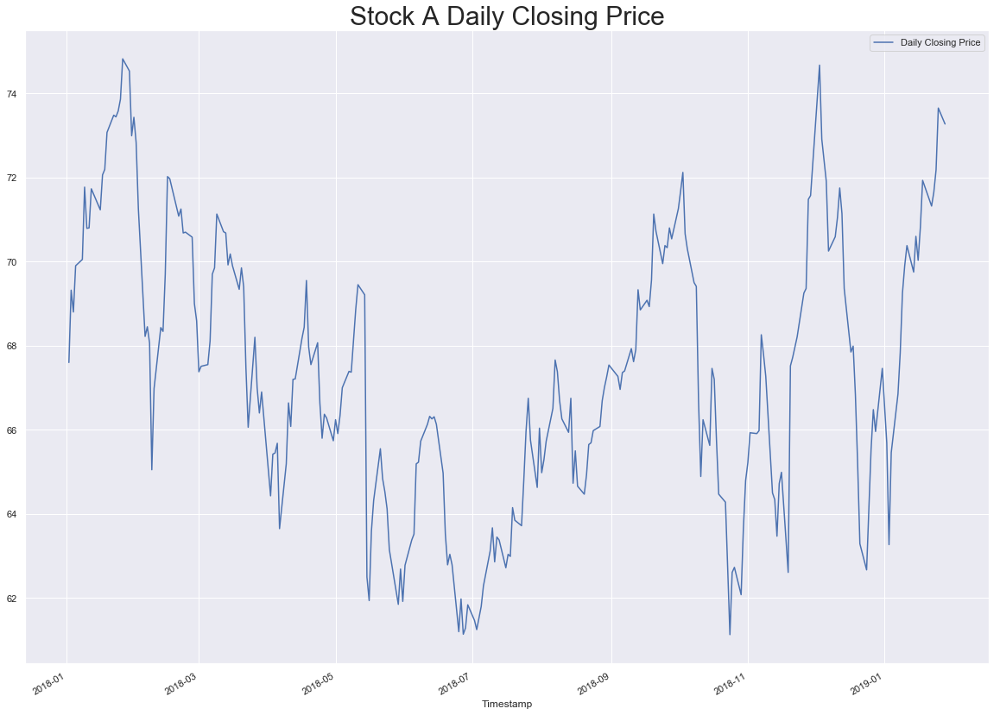

In [29]:
# data visualization of stock A Daily Closing Price by day
ax = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Closing Price']].plot(figsize = (20,15))
#ax.lines[0].set_alpha(0.3)
_ = plt.title('Stock A Daily Closing Price', fontdict = {'fontsize':30})

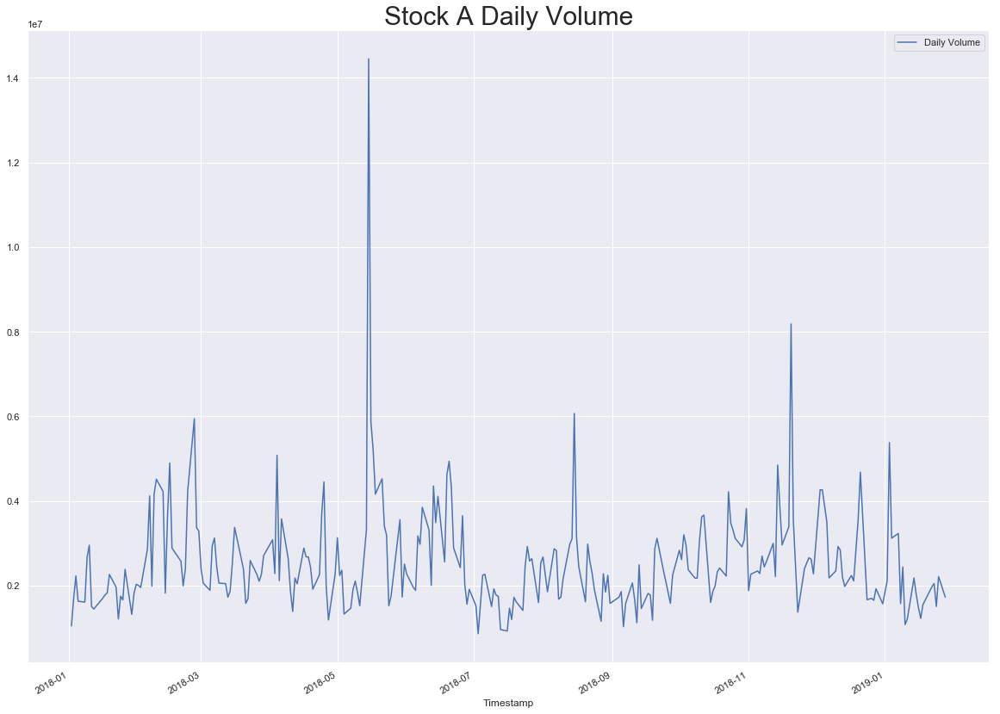

In [30]:
# data visualization of stock A Daily Volume by day
ax = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Volume']].plot(figsize = (20,15))
#ax.lines[0].set_alpha(0.3)
_ = plt.title('Stock A Daily Volume', fontdict = {'fontsize':30})

In [31]:
# Two features in one plot after Normalization

A_df = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Closing Price', 'Daily Volume']]

from sklearn import preprocessing
import numpy as np
import pandas as pd
close_array = np.array(A_df['Daily Closing Price'])
volume_array = np.array(A_df['Daily Volume'])
normalized_close = preprocessing.normalize([close_array])
normalized_volume = preprocessing.normalize([volume_array])
A_df['Daily Closing Price'] = normalized_close.flatten()
A_df['Daily Volume'] = normalized_volume.flatten()
A_df.head()

,Daily Closing Price,Daily Volume
Timestamp,,
2018-01-02,0.061142,0.022407
2018-01-03,0.062698,0.036331
2018-01-04,0.062228,0.047703
2018-01-05,0.063223,0.034911
2018-01-08,0.063358,0.034502


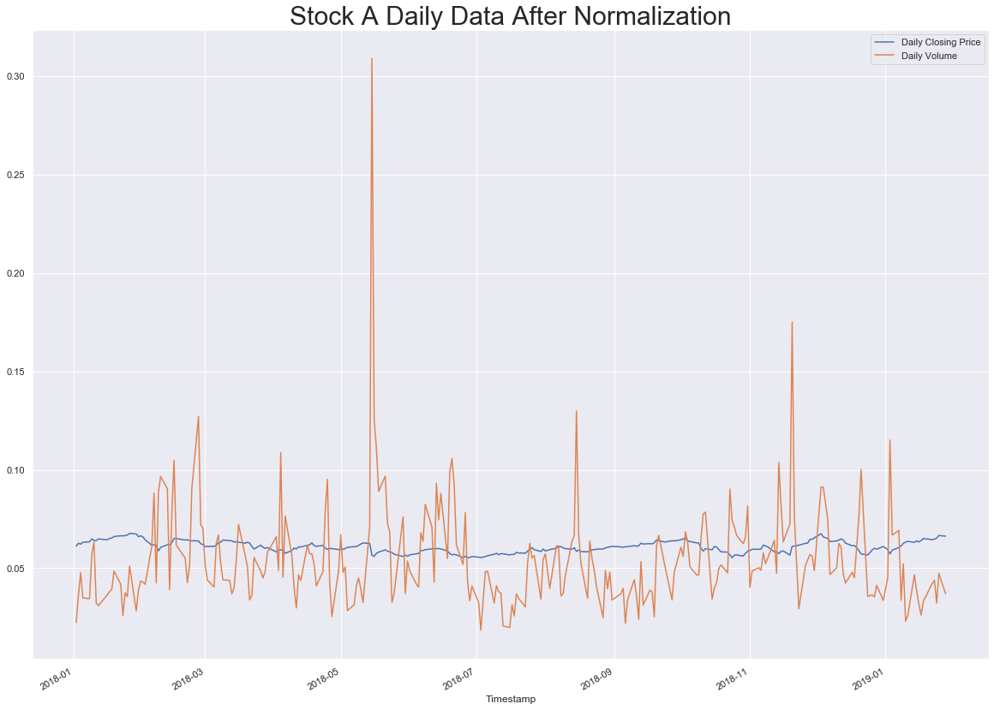

In [32]:
# data visualization of stock A Daily Volume by day
ax = A_df.plot(figsize = (20,15))
_ = plt.title('Stock A Daily Data After Normalization', fontdict = {'fontsize':30})

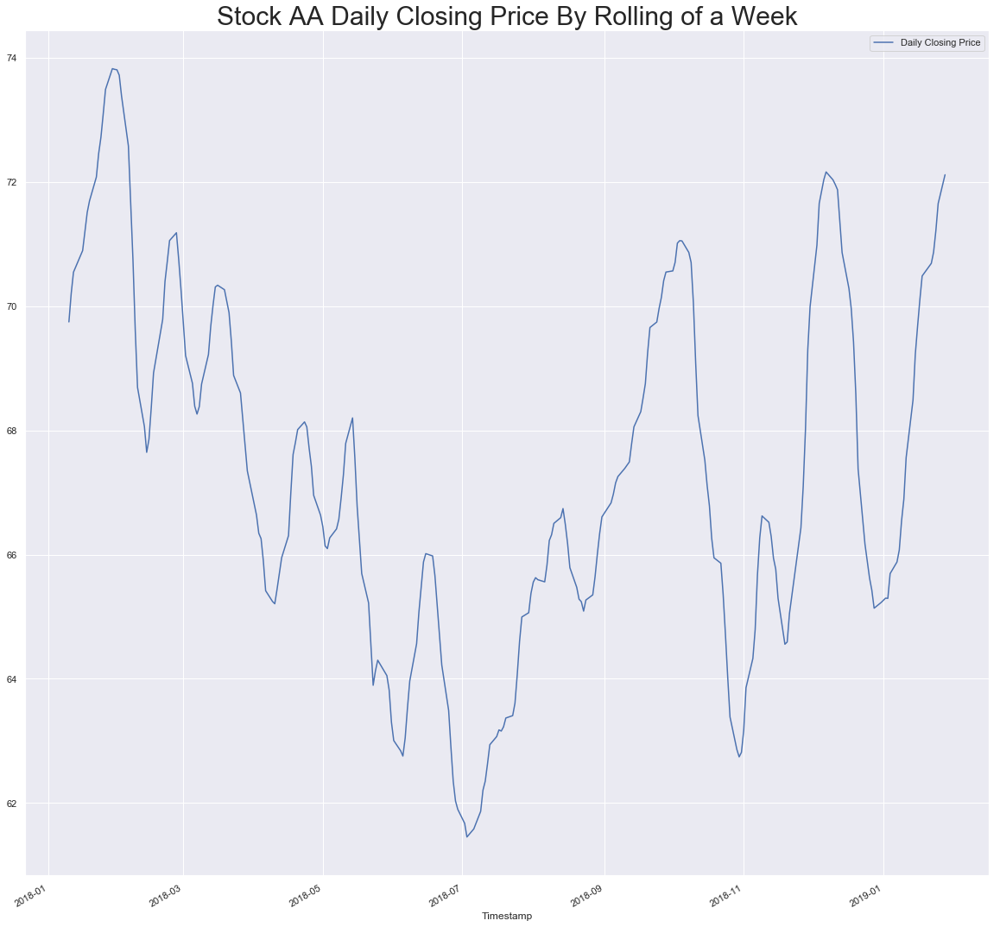

In [33]:
# data visualization of stock AA Closing Price by rolling of a week
ax = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Closing Price']].rolling(7)\
                                                    .mean().plot(style=['-',':'], figsize=(20,20))
_ = plt.title('Stock AA Daily Closing Price By Rolling of a Week', fontdict = {'fontsize':30})

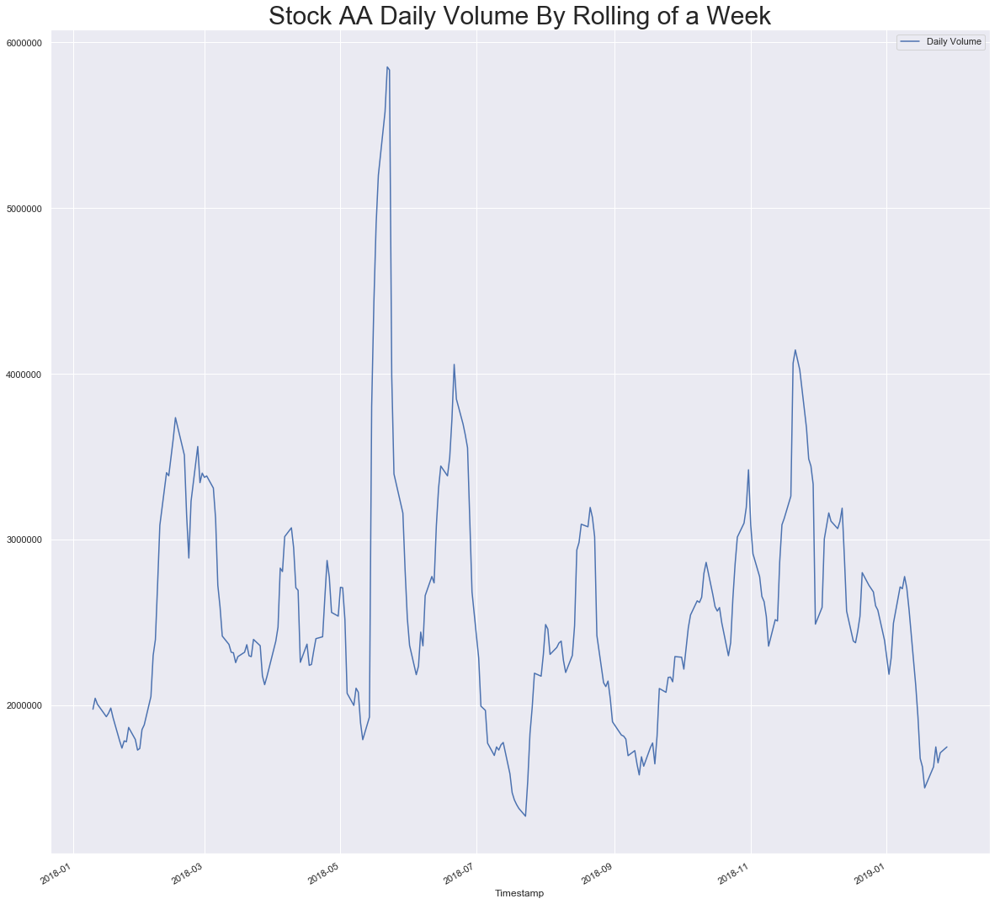

In [34]:
# data visualization of stock AA Volume by rolling of a week
ax = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Volume']].rolling(7)\
                                                    .mean().plot(style=['-',':'], figsize=(20,20))
_ = plt.title('Stock AA Daily Volume By Rolling of a Week', fontdict = {'fontsize':30})

In [35]:
# Correlation 
sp500_plot.corr()

,Daily Closing Price,Daily Volume
Daily Closing Price,1.00000,-0.12477
Daily Volume,-0.12477,1.00000


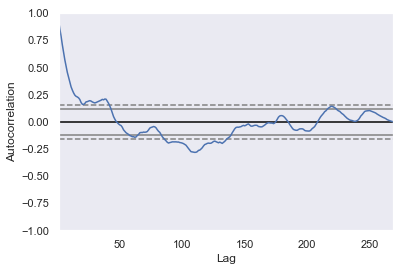

In [36]:
df_close = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Closing Price']]
pd.plotting.autocorrelation_plot(df_close);

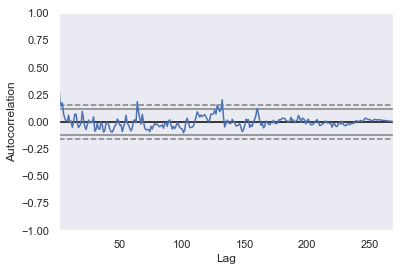

In [37]:
df_volume = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Volume']]
pd.plotting.autocorrelation_plot(df_volume);

## Clustering

In [38]:
sp500_df.head()

,Timestamp,Ticker,Daily Closing Price,Daily Volume
0,2018-01-02,A,67.599998,1047800.0
1,2018-01-03,A,69.320000,1698900.0
2,2018-01-04,A,68.800003,2230700.0
3,2018-01-05,A,69.900002,1632500.0
4,2018-01-08,A,70.050003,1613400.0


In [39]:
sp500_mean = sp500_df.groupby('Ticker').mean()
sp500_mean.reset_index('Ticker', inplace = True)
sp500_mean

,Ticker,Daily Closing Price,Daily Volume
0,A,67.335837,2.559157e+06
1,AAL,42.134944,7.094469e+06
2,AAP,140.702528,1.161929e+06
3,AAPL,186.630223,3.428477e+07
4,ABBV,96.762677,7.148216e+06
5,ABC,88.293866,1.540700e+06
6,ABMD,339.238439,6.366691e+05
7,ABT,64.578178,6.350281e+06
8,ACN,158.757658,2.260205e+06
9,ADBE,235.177249,3.287117e+06


In [40]:
X_train = sp500_mean.loc[:, ['Daily Closing Price', 'Daily Volume']]
X_train

,Daily Closing Price,Daily Volume
0,67.335837,2.559157e+06
1,42.134944,7.094469e+06
2,140.702528,1.161929e+06
3,186.630223,3.428477e+07
4,96.762677,7.148216e+06
5,88.293866,1.540700e+06
6,339.238439,6.366691e+05
7,64.578178,6.350281e+06
8,158.757658,2.260205e+06
9,235.177249,3.287117e+06


### Kmeans

In [41]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

In [42]:
# Elbow method to determine K
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(X_train)
    kmeanModel.fit(X_train)
    distortions.append(sum(np.min(cdist(X_train, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X_train.shape[0])

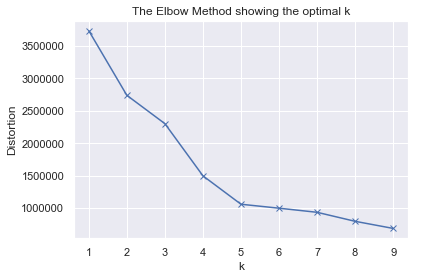

In [43]:
# Plot the elbow
_ = plt.plot(K, distortions, 'bx-')
_ = plt.xlabel('k')
_ = plt.ylabel('Distortion')
_ = plt.title('The Elbow Method showing the optimal k')

In [44]:
# K = 5

In [45]:
# create a KMeans object which will generate 5 clusters
km = KMeans(n_clusters=5)

In [46]:
# use fit_predict() to both fit our k-means model and generate cluster assignments 
cluster_assignments = km.fit_predict(X_train)
cluster_assignments[:10]

array([3, 0, 3, 2, 0, 3, 3, 0, 3, 3], dtype=int32)

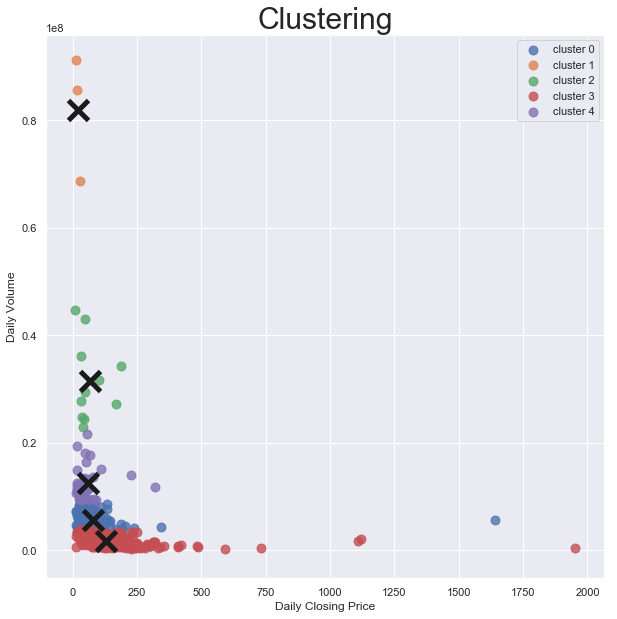

In [47]:
# Visualization of Clustering
fig = plt.figure(figsize=(10,10))
for i in range(5):
    X_subset = X_train[cluster_assignments == i]
    plt.scatter(X_subset.iloc[:,0], X_subset.iloc[:,1],s = 80,alpha = 0.8, label = 'cluster '+str(i))
    plt.plot(km.cluster_centers_[i][0],km.cluster_centers_[i][1],marker='x',c='k', ms=20, mew=5, label=None);
_ = plt.legend();
_ = plt.xlabel('Daily Closing Price');
_ = plt.ylabel('Daily Volume')
_ = plt.title('Clustering', fontdict = {'fontsize':30})

In [48]:
# Add the cluster assignment to sp500_mean
sp500_mean['Cluster'] = cluster_assignments
sp500_mean

,Ticker,Daily Closing Price,Daily Volume,Cluster
0,A,67.335837,2.559157e+06,3
1,AAL,42.134944,7.094469e+06,0
2,AAP,140.702528,1.161929e+06,3
3,AAPL,186.630223,3.428477e+07,2
4,ABBV,96.762677,7.148216e+06,0
5,ABC,88.293866,1.540700e+06,3
6,ABMD,339.238439,6.366691e+05,3
7,ABT,64.578178,6.350281e+06,0
8,ACN,158.757658,2.260205e+06,3
9,ADBE,235.177249,3.287117e+06,3


## Descriptive Statistics

In [49]:
from scipy.stats import trim_mean, kurtosis
from scipy.stats.mstats import mode, gmean, hmean

In [50]:
sp500_plot.describe()

,Daily Closing Price,Daily Volume
count,135621.000000,1.356210e+05
mean,112.399284,4.493829e+06
std,150.547094,9.234167e+06
min,6.110000,0.000000e+00
25%,47.759998,1.147800e+06
50%,77.629997,2.177200e+06
75%,129.179993,4.479400e+06
max,2206.090088,3.449767e+08


In [51]:
df_group_daily_close = sp500_mean.groupby('Cluster')['Daily Closing Price']
df_group_daily_close.describe().sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
1,3.0,19.849988,8.716048,12.619740,15.010836,17.401933,23.465111,29.528290
4,34.0,58.642456,60.557344,14.920037,24.050446,45.568085,64.035009,319.609331
2,11.0,68.069324,58.773703,10.278476,34.447807,44.207435,75.106599,186.630223
0,108.0,80.155136,160.268453,13.085836,30.464052,51.569591,78.339870,1641.378849
3,349.0,129.788103,151.673193,14.586877,63.100892,94.937695,150.242714,1952.067553


In [52]:
df_group_daily_volume = sp500_mean.groupby('Cluster')['Daily Volume']
df_group_daily_volume.describe().sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
3,349.0,1.810404e+06,9.029222e+05,1.800059e+05,1.075343e+06,1.670255e+06,2.456785e+06,3.745881e+06
0,108.0,5.727400e+06,1.378366e+06,3.781800e+06,4.554084e+06,5.416085e+06,6.429943e+06,9.062070e+06
4,34.0,1.250684e+07,3.133684e+06,9.311010e+06,9.933736e+06,1.151196e+07,1.354051e+07,2.165800e+07
2,11.0,3.148801e+07,7.361863e+06,2.287167e+07,2.600058e+07,2.939399e+07,3.524688e+07,4.465489e+07
1,3.0,8.185593e+07,1.177164e+07,6.867068e+07,7.712930e+07,8.558791e+07,8.844856e+07,9.130921e+07


In [53]:
# trim mean for Daily Closing Price sorted
df_group_daily_close.apply(trim_mean, .1).sort_values().reset_index()

/Users/panzichen/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:2831: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.mean(atmp[sl], axis=axis)


,Cluster,Daily Closing Price
0,1,19.849988
1,4,46.116119
2,0,57.636126
3,2,61.317096
4,3,105.664704


In [54]:
# trim mean for Daily Volume sorted
df_group_daily_volume.apply(trim_mean, .1).sort_values().reset_index()

,Cluster,Daily Volume
0,3,1.759387e+06
1,0,5.606417e+06
2,4,1.207059e+07
3,2,3.098239e+07
4,1,8.185593e+07


## Prediction 

In [55]:
import warnings
import itertools
plt.style.use('fivethirtyeight')
import statsmodels.api as sm

In [56]:
# We predict the Daily Closing Price of Stock A
df_A = sp500_plot.loc[sp500_plot['Ticker'] == 'A', ['Daily Closing Price']]
df_A.head()

,Daily Closing Price
Timestamp,
2018-01-02,67.599998
2018-01-03,69.320000
2018-01-04,68.800003
2018-01-05,69.900002
2018-01-08,70.050003


### Check Stationarity

In [57]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(7).mean()
    rolstd = timeseries.rolling(7).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

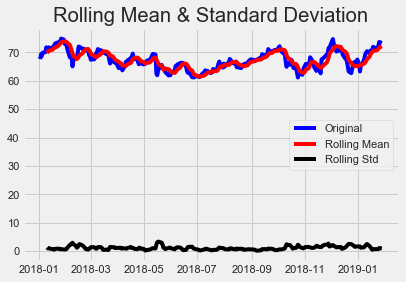

In [58]:
test_stationarity(df_A)

In [59]:
# We can tell that the dataset is approximately stationary

In [60]:
df_A_weekly = df_A.resample('B').mean()
df_A_weekly.fillna(method='ffill', inplace = True)
df_A_weekly

,Daily Closing Price
Timestamp,
2018-01-02,67.599998
2018-01-03,69.320000
2018-01-04,68.800003
2018-01-05,69.900002
2018-01-08,70.050003
2018-01-09,71.769997
2018-01-10,70.790001
2018-01-11,70.800003
2018-01-12,71.730003


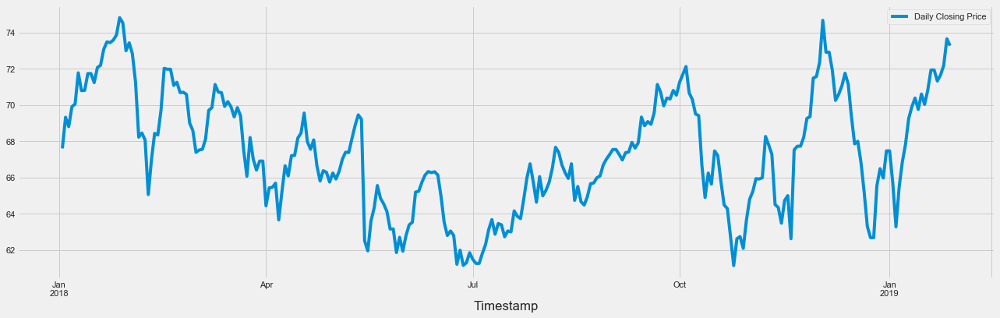

In [61]:
_ = df_A_weekly.plot(figsize = (20,6))

### ARIMA

In [62]:
# ARIMA
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(df_A_weekly,\
                                            order=param,\
                                            seasonal_order=param_seasonal,\
                                            enforce_stationarity=False,\
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

/Users/panzichen/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/representation.py:375: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return matrix[[slice(None)]*(matrix.ndim-1) + [0]]


ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:3143.5366858185707
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2693.3262148742187
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1452.2647044472
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1322.3636193805055
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1460.2127683287815
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1385.2829171683507
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1352.9293400423173
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1332.9423463817932
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2757.0227803991684
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2325.261260104784
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1214.8812523937772
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1081.8444828720444
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1227.2325076683946
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1135.2135290965707
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1123.6985635909136
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1083.5728925976878
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:854.3606186748885
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:824.329898591955

/Users/panzichen/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(1, 0, 0)x(1, 0, 1, 12)12 - AIC:830.3711461120702
ARIMA(1, 0, 0)x(1, 1, 0, 12)12 - AIC:883.8298527937545
ARIMA(1, 0, 0)x(1, 1, 1, 12)12 - AIC:824.8275619208032
ARIMA(1, 0, 1)x(0, 0, 0, 12)12 - AIC:858.0189583072561
ARIMA(1, 0, 1)x(0, 0, 1, 12)12 - AIC:827.9350656502804
ARIMA(1, 0, 1)x(0, 1, 0, 12)12 - AIC:1010.7817042220368
ARIMA(1, 0, 1)x(0, 1, 1, 12)12 - AIC:812.9963325583699
ARIMA(1, 0, 1)x(1, 0, 0, 12)12 - AIC:830.4409839893067
ARIMA(1, 0, 1)x(1, 0, 1, 12)12 - AIC:828.7059507057648
ARIMA(1, 0, 1)x(1, 1, 0, 12)12 - AIC:883.8721434378583
ARIMA(1, 0, 1)x(1, 1, 1, 12)12 - AIC:822.5178361516354
ARIMA(1, 1, 0)x(0, 0, 0, 12)12 - AIC:856.0923151228267
ARIMA(1, 1, 0)x(0, 0, 1, 12)12 - AIC:825.9792214501305
ARIMA(1, 1, 0)x(0, 1, 0, 12)12 - AIC:1025.6658594971059
ARIMA(1, 1, 0)x(0, 1, 1, 12)12 - AIC:818.1981143710395
ARIMA(1, 1, 0)x(1, 0, 0, 12)12 - AIC:825.6336472591349
ARIMA(1, 1, 0)x(1, 0, 1, 12)12 - AIC:826.708748726139
ARIMA(1, 1, 0)x(1, 1, 0, 12)12 - AIC:888.6235218856726
ARIMA(1, 

In [63]:
# SARIMAX(1, 1, 1)x(0, 1, 1, 12) yields the lowest AIC value of 810.1769504153424

In [64]:
mod = sm.tsa.statespace.SARIMAX(df_A_weekly,
                                order=(1, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8781      0.059    -14.945      0.000      -0.993      -0.763
ma.L1          0.9631      0.047     20.440      0.000       0.871       1.055
ma.S.L12      -1.0299      0.115     -8.963      0.000      -1.255      -0.805
sigma2         1.1925      0.181      6.571      0.000       0.837       1.548


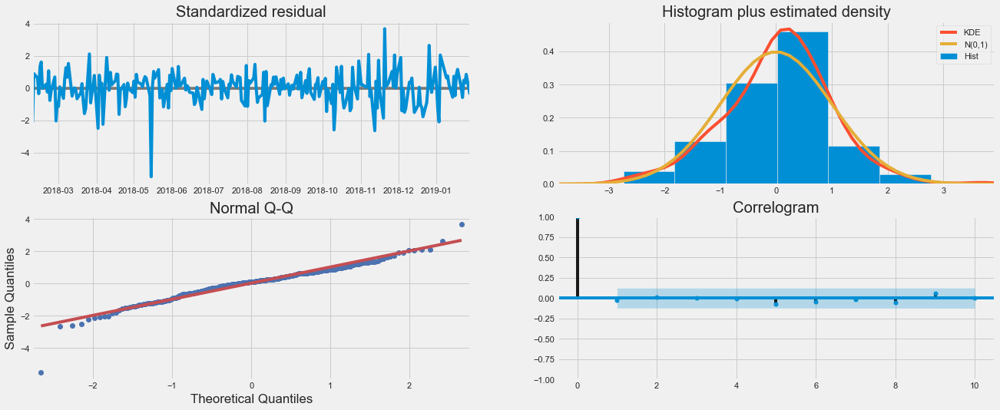

In [65]:
_ = results.plot_diagnostics(figsize=(20, 8))

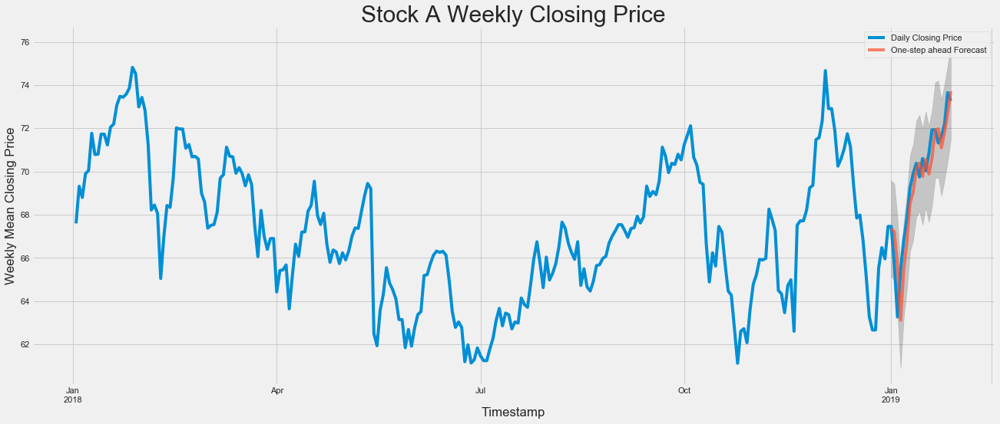

In [66]:
pred = results.get_prediction(start=pd.to_datetime('2019-01-01'), dynamic=False)
pred_confidence_interval = pred.conf_int()
ax = df_A_weekly['2018':].plot(label='observed')
_ = pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(20, 8))
ax.fill_between(pred_confidence_interval.index,
                pred_confidence_interval.iloc[:, 0],
                pred_confidence_interval.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Timestamp')
ax.set_ylabel('Weekly Mean Closing Price')
_ = plt.title('Stock A Weekly Closing Price', fontdict = {'fontsize':30})
_ = plt.legend()

In [67]:
# RMSE
A_forecasted = pred.predicted_mean
A_truth = df_A_weekly['2019-01-01':].loc[:,'Daily Closing Price']
mse = ((A_forecasted - A_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of our forecasts is 1.09


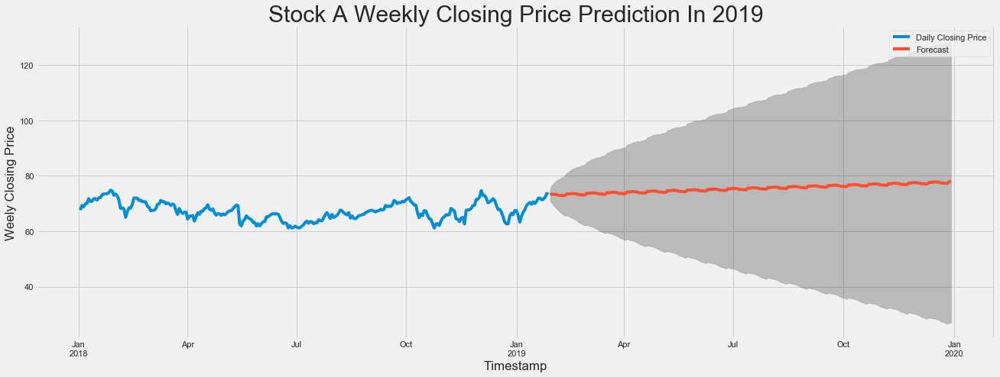

In [68]:
# Prediction Visualization
pred_uc = results.get_forecast(steps=240)
pred_ci = pred_uc.conf_int()
ax = df_A_weekly.plot(label='observed', figsize=(20, 7))
_ = pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Timestamp')
ax.set_ylabel('Weely Closing Price')
_ = plt.title('Stock A Weekly Closing Price Prediction In 2019', fontdict = {'fontsize':30})
_ = plt.legend()

### Prophet

In [69]:
from fbprophet import Prophet

In [70]:
# Dataframe must have columns 'ds' and 'y' with the dates and values respectively
df_A_prophet = df_A_weekly.reset_index('Timestamp')
df_A_prophet = df_A_prophet.rename(columns={'Timestamp': 'ds',
                        'Daily Closing Price': 'y'})
df_A_prophet.head()

,ds,y
0,2018-01-02,67.599998
1,2018-01-03,69.320000
2,2018-01-04,68.800003
3,2018-01-05,69.900002
4,2018-01-08,70.050003


In [71]:
# set the uncertainty interval to 95%
my_model = Prophet(interval_width=0.95, daily_seasonality=True, weekly_seasonality=True)

In [72]:
my_model.fit(df_A_prophet)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/Users/panzichen/anaconda3/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


In [73]:
future_dates = my_model.make_future_dataframe(periods=240, freq='B')
future_dates.head()

,ds
0,2018-01-02
1,2018-01-03
2,2018-01-04
3,2018-01-05
4,2018-01-08


In [74]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2018-01-02,71.911728,67.388729,76.413277
1,2018-01-03,71.944779,66.857476,76.354073
2,2018-01-04,71.929352,67.693502,76.197755
3,2018-01-05,71.938035,67.268233,76.369699
4,2018-01-08,71.738776,67.052008,76.180052


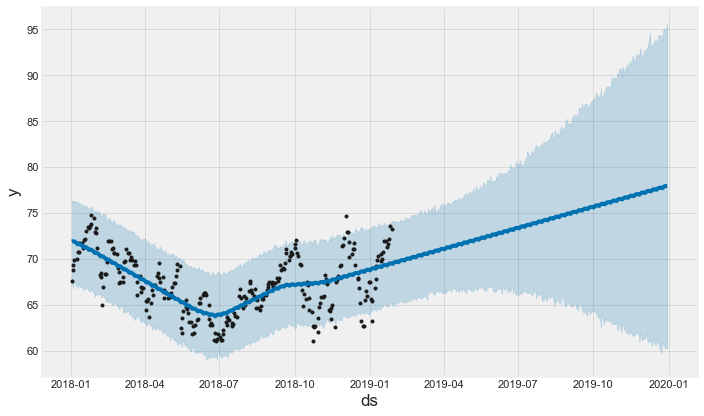

In [75]:
_ = my_model.plot(forecast,uncertainty=True)

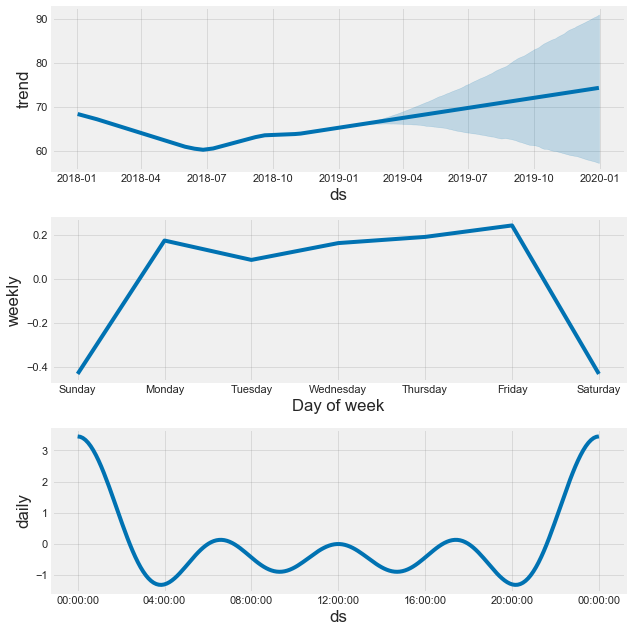

In [76]:
_ = my_model.plot_components(forecast)

In [77]:
forecast.set_index('ds', inplace = True)
forecast.head()

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,
2018-01-02,68.373289,67.388729,76.413277,68.373289,68.373289,3.538439,3.538439,3.538439,3.451147,3.451147,3.451147,0.087293,0.087293,0.087293,0.0,0.0,0.0,71.911728
2018-01-03,68.329764,66.857476,76.354073,68.329764,68.329764,3.615015,3.615015,3.615015,3.451147,3.451147,3.451147,0.163868,0.163868,0.163868,0.0,0.0,0.0,71.944779
2018-01-04,68.286240,67.693502,76.197755,68.286240,68.286240,3.643112,3.643112,3.643112,3.451147,3.451147,3.451147,0.191966,0.191966,0.191966,0.0,0.0,0.0,71.929352
2018-01-05,68.242715,67.268233,76.369699,68.242715,68.242715,3.695320,3.695320,3.695320,3.451147,3.451147,3.451147,0.244173,0.244173,0.244173,0.0,0.0,0.0,71.938035
2018-01-08,68.112142,67.052008,76.180052,68.112142,68.112142,3.626634,3.626634,3.626634,3.451147,3.451147,3.451147,0.175488,0.175488,0.175488,0.0,0.0,0.0,71.738776


In [78]:
A_forecasted = forecast['2019-01'].yhat
A_forecasted.head()

ds
2019-01-01    68.780754
2019-01-02    68.882368
2019-01-03    68.935504
2019-01-04    69.012750
2019-01-07    69.019181
Name: yhat, dtype: float64

In [79]:
A_truth = df_A_weekly['2019-01-01':'2019-02-01'].loc[:,'Daily Closing Price']
A_truth.head()

Timestamp
2019-01-01    67.459999
2019-01-02    65.690002
2019-01-03    63.270000
2019-01-04    65.459999
2019-01-07    66.849998
Freq: B, Name: Daily Closing Price, dtype: float64

In [80]:
# RMSE
mse = ((A_forecasted - A_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of our forecasts is 2.55


## Classification

In [81]:
sp500_mean.head()

,Ticker,Daily Closing Price,Daily Volume,Cluster
0,A,67.335837,2.559157e+06,3
1,AAL,42.134944,7.094469e+06,0
2,AAP,140.702528,1.161929e+06,3
3,AAPL,186.630223,3.428477e+07,2
4,ABBV,96.762677,7.148216e+06,0


In [82]:
# Data
X = sp500_mean.iloc[:,1:3]
X.head()

,Daily Closing Price,Daily Volume
0,67.335837,2.559157e+06
1,42.134944,7.094469e+06
2,140.702528,1.161929e+06
3,186.630223,3.428477e+07
4,96.762677,7.148216e+06


In [83]:
# Label
y = sp500_mean.loc[:, 'Cluster']
y.head()

0    3
1    0
2    3
3    2
4    0
Name: Cluster, dtype: int32

In [84]:
assert len(X) == len(y)

In [85]:
# num of each cluster
sp500_mean.groupby('Cluster').agg(['count']).loc[:, 'Ticker']

,count
Cluster,
0,108
1,3
2,11
3,349
4,34


In [86]:
# incorporate cluster 2 to cluster 3
y = y.replace(2,3)

In [87]:
from sklearn.model_selection import train_test_split

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)

In [89]:
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

In [90]:
# dummy
dummy_model = DummyClassifier(strategy='most_frequent').fit(X_train,y_train)
dummy_pred = dummy_model.predict(X_test)

In [91]:
# logistic 
logreg_model = LogisticRegression(solver = 'liblinear', multi_class = 'auto').fit(X_train,y_train)
logreg_pred = logreg_model.predict(X_test)

In [92]:
# Decision Tree
dtc_model = DecisionTreeClassifier().fit(X_train,y_train)
dtc_pred = dtc_model.predict(X_test)

In [93]:
# Gradient Boosting
gbc_model = GradientBoostingClassifier().fit(X_train,y_train)
gbc_pred = gbc_model.predict(X_test)

In [94]:
# Random Forest
from sklearn.model_selection import GridSearchCV

params = {'n_estimators':[5,50,100]}
gs = GridSearchCV(RandomForestClassifier(),params,cv=3,n_jobs=-1).fit(X_train,y_train)

/Users/panzichen/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


In [95]:
print('gs best accuracy: {:.3f}'.format(gs.best_estimator_.score(X_train,y_train)))
print('gs best params  : {}'.format(gs.best_params_))

gs best accuracy: 1.000
gs best params  : {'n_estimators': 50}


In [96]:
rf_model = RandomForestClassifier(n_estimators=50).fit(X_train,y_train)
rf_pred = rf_model.predict(X_test)

In [97]:
# comparison of cross validation accuracy on training data

from sklearn.model_selection import cross_val_score

# dummy
scores = cross_val_score(dummy_model,X_train,y_train,cv=5)
print('Dummy: {:.2f}'.format(np.mean(scores)))

# logistic 
scores = cross_val_score(logreg_model,X_train,y_train,cv=5)
print('Logistic Regression: {:.2f}'.format(np.mean(scores)))

# Decision Tree
scores = cross_val_score(dtc_model,X_train,y_train,cv=5)
print('Decision Tree: {:.2f}'.format(np.mean(scores)))

# Gradient Boosting
scores = cross_val_score(gbc_model,X_train,y_train,cv=5)
print('Gradient Boosting: {:.2f}'.format(np.mean(scores)))

# Random Forest 
scores = cross_val_score(rf_model,X_train,y_train,cv=5)
print('Random Forest: {:.2f}'.format(np.mean(scores)))

Dummy: 0.71
Logistic Regression: 0.72
Decision Tree: 0.99


/Users/panzichen/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/Users/panzichen/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/Users/panzichen/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/Users/panzichen/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class i

Gradient Boosting: 0.99
Random Forest: 0.98


/Users/panzichen/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
